# XGBoost to predict discharge disability: Stroke severity feature format

Analyse the contribution of the individual NIHSS features, rather than using the single stroke severity feature. This is a combination of code from notebooks 010, 011, 012, 013 for this combination of features, for the first kfold.

### Plain English summary

A set of notebooks provided further information about which combination of features to choose. This process isolated a feature to assess what contribution it had on the models prediction.

Following that exercise, we chose 7 features: 
1. Prior disability level: Disability level (modified Rankin Scale) before stroke
1. Stroke severity: Stroke severity (NIHSS) on arrival
1. Stroke team: Stroke team that the patient attended
1. Age: Age (as middle of 5 year age bands)
1. Onset to thrombolysis time: Time from onset to receiving thrombolysis (minutes). Set to -100 if did not recieve thrombolysis.
1. Any afib diagnosis: Patient has a diagnosis of atrial fibrillation (either on arrival or new)
1. Precise onset known: Onset time recorded is precise time (not a best estimate)

Here we use the 6 chosen features plus the 15 individual NIHSS scores in place of the single stroke_severity feature.

The results from this model is used to analyse the contribution of the individual NIHSS features, rather than using the single stroke severity feature.

Use the first kfold as seen performance of model is consistent across the 5 data divisions.

This model includes 21 features (the 6 selected features and the 15 individual NIHSS features).

Look at model accuracy (from notebook 010), SHAP values and feature importance (from notebooks 011, 012 and 013).

### Model and data

**Model**: XGBoost classifier (multiclass classification)\
**Target feature**: Discharge disability\
**Input features**: 21 features (prior_disability, stroke_team, age, onset_to_thrombolysis_time, nihss_arrival_loc, nihss_arrival_loc_questions, nihss_arrival_loc_commands, nihss_arrival_best_gaze, nihss_arrival_visual,nihss_arrival_facial_palsy, nihss_arrival_motor_arm_left, nihss_arrival_motor_arm_right, nihss_arrival_motor_leg_left, nihss_arrival_motor_leg_right, nihss_arrival_limb_ataxia, nihss_arrival_sensory, nihss_arrival_best_language, nihss_arrival_dysarthria, nihss_arrival_extinction_inattention).\
**Kfold split**: First kfold split
**SHAP values**: Calculated here

The multiclass classification model for our application is a single model made up of a separate model per mRS level, that gives the probablity of being each mRS level, and the sum of them all equals 1 ("softmax"), and prediction is the mRS level with the highest probability.

### Aims
The results from this model is used to analyse the contribution of the individual NIHSS features, rather than using the single stroke severity feature.

### Observations



#### Further work

#### Resources
Using code from https://github.com/samuel-book/samuel_shap_paper_1/blob/main/xgb_10_features/02b_xgb_combined_fit_accuracy_key_features_separate_k_fold.ipynb

and https://github.com/samuel-book/samuel_shap_paper_1/blob/main/xgb_10_features/03_xgb_combined_shap_key_features.ipynb


##### Other models in this set
model40: simple with 5 features (compare others to this - what we thought would be our feature selection. Check not missing anything by running the other models)\
key_features = ["prior_disability", "stroke_severity", "stroke_team", "age", "onset_to_thrombolysis_time"]

model41: Four features (compare this to the two models with a duration (model41 with onset-to-thrombolysis-time and model42 with scan-to-thrombolysis-time)\
key_features = ["prior_disability", "stroke_severity", "stroke_team", "age"]

model42 Is it reasonable to replace scan_to_thrombolysis with onset_to_thrombolysis time (the AUC using the 4 other features plus i. scan to IVT, or ii. arrival the IVT).\
key_features = ["prior_disability", "stroke_severity", "stroke_team", "age", "scan_to_thrombolysis"]

model43 What information does Year add? Is it a general trend for year. A dip in covid year?\
key_features = ["prior_disability", "stroke_severity", "stroke_team", "age", "onset_to_thrombolysis", "year"]

model44 What information does the individual NIHSS scores add over the stroke severity feature. Which contributes what?\
key_features = ["prior_disability", "stroke_team", "age", "onset_to_thrombolysis", "nihss_arrival_loc", "nihss_arrival_loc_questions",
                "nihss_arrival_loc_commands","nihss_arrival_best_gaze","nihss_arrival_visual",
                "nihss_arrival_facial_palsy","nihss_arrival_motor_arm_left","nihss_arrival_motor_arm_right",
                "nihss_arrival_motor_leg_left","nihss_arrival_motor_leg_right","nihss_arrival_limb_ataxia",
                "nihss_arrival_sensory","nihss_arrival_best_language","nihss_arrival_dysarthria",
                "nihss_arrival_extinction_inattention"]

model45 What information does atrial_fibrilation give the model? The feature selection process cselected existing diagnosis (atrial_fibrilliation) and new diagnosis (new_afib_diagnosis), but not the single feature that contains the information of both of these (any_afib_diagnosis).\
key_features = ["prior_disability", "stroke_severity", "stroke_team", "age", "onset_to_thrombolysis", "atrial_fibrillation"]

model46 What information does new_afib_diagnosis give the model? The feature selection process cselected existing diagnosis (atrial_fibrilliation) and new diagnosis (new_afib_diagnosis), but not the single feature that contains the information of both of these (any_afib_diagnosis).\
key_features = ["prior_disability", "stroke_severity", "stroke_team", "age", "onset_to_thrombolysis", "new_afib_diagnosis"]

model47 What information does any_afib_diagnosis give the model? The feature selection process cselected existing diagnosis (atrial_fibrilliation) and new diagnosis (new_afib_diagnosis), but not the single feature that contains the information of both of these (any_afib_diagnosis).\
key_features = ["prior_disability", "stroke_severity", "stroke_team", "age", "onset_to_thrombolysis", "any_afib_diagnosis"]

model48 What information does "thrombolysis_no_but_improving" add?\
key_features = ["prior_disability", "stroke_severity", "stroke_team", "age", "onset_to_thrombolysis", "thrombolysis_no_but_improving"]

model49 What information does "thrombolysis_no_but_other_medical" add?\
key_features = ["prior_disability", "stroke_severity", "stroke_team", "age", "onset_to_thrombolysis", "thrombolysis_no_but_other_medical"]

## Import libraries

In [1]:
# Turn warnings off to keep notebook tidy
import warnings
warnings.filterwarnings("ignore")

import os
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd

from xgboost import XGBClassifier
from sklearn.metrics import auc
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix

from dataclasses import dataclass

import seaborn as sns

import pickle
import shap

from os.path import exists

import math

import time
import datetime

Report the time duration to run notebook

In [2]:
start_time = time.time()

Set to use only the first kfold

In [3]:
k = 0

Select the features for the model

In [4]:
selected_features = ["prior_disability", "stroke_team", "age", 
                     "onset_to_thrombolysis_time", "any_afib_diagnosis", 
                     "precise_onset_known", 
                     "nihss_arrival_loc", "nihss_arrival_loc_questions", 
                     "nihss_arrival_loc_commands","nihss_arrival_best_gaze","nihss_arrival_visual",
                     "nihss_arrival_facial_palsy","nihss_arrival_motor_arm_left",
                     "nihss_arrival_motor_arm_right", "nihss_arrival_motor_leg_left",
                     "nihss_arrival_motor_leg_right","nihss_arrival_limb_ataxia",
                     "nihss_arrival_sensory","nihss_arrival_best_language","nihss_arrival_dysarthria",
                     "nihss_arrival_extinction_inattention"]
n_features = len(selected_features)

target_feature = 'discharge_disability'

## Set up paths and filenames

For consistency, the folders end with "/" and the text for filenames include no trailing "_".

In [5]:
@dataclass(frozen=True)
class Paths:
    '''Singleton object for storing paths to data and database.'''
#    output_save_path: str = './output/'
    image_save_path: str = './saved_images/'
    data_save_path: str = './saved_data/'
    model_save_path: str = './saved_models/'
    data_read_path: str = '../data_processing/output/kfold_5fold/'
    model_text: str = f'xgb_{n_features}_features_1fold'
    notebook: str = '024_'

paths = Paths()

Create output folders if needed

In [6]:
path = paths.image_save_path
if not os.path.exists(path):
    os.makedirs(path)
        
path = paths.model_save_path
if not os.path.exists(path):
    os.makedirs(path)

path = paths.data_save_path
if not os.path.exists(path):
    os.makedirs(path)

## Import data

Read in the first k fold data split

In [7]:
# Read in training set, restrict to chosen features & store
filename = os.path.join(paths.data_read_path, 
                        ('03_train_' + str(k) + '.csv'))
train = pd.read_csv(filename)
X_train = train[selected_features]
y_train = train[target_feature]

filename = os.path.join(paths.data_read_path, 
                        ('03_test_' + str(k) + '.csv'))
test = pd.read_csv(filename)
X_test = test[selected_features]
y_test = test[target_feature]

Store the output classes

In [8]:
class_names = y_train.unique()
class_names = np.sort(class_names)
n_classes = len(class_names)

Store the stroke team column, before gets replaces with ohe features

In [9]:
test_stroke_team = X_test["stroke_team"]

### One hot the categorical features

Convert some categorical features to one hot encoded features.

Define a function

In [10]:
def convert_feature_to_one_hot(df, feature_name, prefix):
    """
    Converts a categorical feature into a one hot encoded feature
    
    Args:
        df [dataframe]: training or test dataset
        feature_name [str]: feature to convert to one hot encoding
        prefix [str]: string to use on new feature

    Return:
        df [dataframe]: One hot encoded representation of the feature
    """
    # One hot encode a feature
    df_feature = pd.get_dummies(
        df[feature_name], prefix = prefix)
    df = pd.concat([df, df_feature], axis=1)
    df.drop(feature_name, axis=1, inplace=True)

    return(df)

Set up two lists for the one hot encoding. 

A list of the feature names that are categorical and to be converted using one hot encoding.
A list of the prefixes to use for these features.

In [11]:
features_to_one_hot = ["stroke_team", "weekday"]
list_prefix = ["team", "weekday"]

For each feature in the list, for each train and test dataset, convert to one hot encoded.

In [12]:
for feature, prefix in zip(features_to_one_hot, list_prefix):
    if feature in selected_features:
        X_train = convert_feature_to_one_hot(X_train, feature, prefix)
        X_test = convert_feature_to_one_hot(X_test, feature, prefix)

Feature names with one hot encoding

In [13]:
feature_names_ohe = list(X_train)
n_features_ohe = len(feature_names_ohe)
print(f"There are {n_features} original input features (before one-hot encoding)")
print(f"There are {n_features_ohe} input features (after one-hot encoding)")

There are 21 original input features (before one-hot encoding)
There are 138 input features (after one-hot encoding)


## Fit XGBoost model

Train model with all features (same as used in notebook 02_xgb_feature_selection.ipynb for comparison with the feature selection models)

Create function to return X and y data for train and test sets

In [14]:
def get_x_y_data(train, test, target):
    """
    Pass data from the split and return the dataframes with the target in one 
    dataframe (X), and dependent features in another (y)
    
    train (dataframe): dataframe containing training instances 
    test (dataframe): dataframe containing test instances
    target (string): column name of the targert feature (the column to separate from the two dataframes)
    """    

    # Get X and y
    X_train = train.drop(target, axis=1)
    X_test = test.drop(target, axis=1)
    y_train = train[target]
    y_test = test[target]

    return(X_train, X_test, y_train, y_test)

Create function to get xgboost model (either load if file exists, else train)

In [15]:
def fit_xgb_model(filename, X_train, y_train):
    """
    Given the filename, either load if the model exists (saved as a pickle), 
    else train a new model.

    Args:
        filename [string]: where xgboost model is saved
        X_train [dataframe]: feature values
        y_train [dataframe]: target feature
        
    Returns:
        model [object]: xgboost classifier model

    """
    # Check if exists
    file_exists = exists(filename)

    if file_exists:
    # Load models
        with open(filename, 'rb') as filehandler:
            model = pickle.load(filehandler)
    else:
        # Define and Fit model
        model = XGBClassifier(verbosity=0, seed=42, learning_rate=0.5,
                              tree_method='gpu_hist')
        model.fit(X_train, y_train)

        # Save using pickle
        with open(filename, 'wb') as filehandler:
            pickle.dump(model, filehandler)
    return(model)   


In [16]:
# Model filename
filename = os.path.join(paths.model_save_path, 
                (paths.notebook + paths.model_text + '_' + str(k) + '.p'))

model = fit_xgb_model(filename, X_train, y_train)

# Get target categories from model
classes = model.classes_

# Get and store predicted probabilities
y_probs = model.predict_proba(X_test)

# Get and store predicted class
y_pred = model.predict(X_test)

# Calculate ROC AUC for multiclass models, using One vs Rest
roc_auc_ovr = roc_auc_score(y_test, y_probs, labels = classes, 
                            multi_class = 'ovr', average = 'macro')

# Calculate error
y_error = y_test - y_pred
accuracy = np.mean(y_error==0)

error_within_one = np.mean(np.abs(y_error)<=1)

# Get and store feature importances
feature_importance = model.feature_importances_

## Section 1: Accuracy

### Section 1.1 Accuracy (average and consistency across k-folds)
i. % correct
ii. % within one correct

Get average result from all k-fold splits

In [17]:
print (f'All features, accuracy: {accuracy:0.3f}')
print (f'All features, accuracy within one: {error_within_one:0.3f} ')

All features, accuracy: 0.432
All features, accuracy within one: 0.751 


### Section 1.2 Confusion matrix
Resource (subplots with imshow): https://stackoverflow.com/questions/18266642/multiple-imshow-subplots-each-with-colorbar

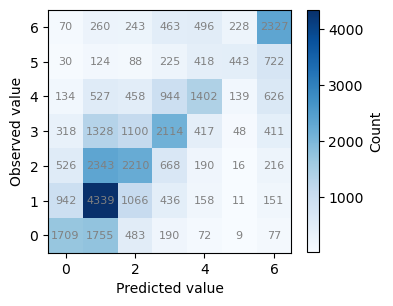

In [18]:
# Define for the figure
fig, axs = plt.subplots(nrows=1, ncols=1)

# Set figure width relative to the number of kfolds
fig.set_size_inches(4,5)

# Legend height
shrink = 0.5

row = 0
col = 0

ax = axs
    
# Calculate values for confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix with colors
heatmap = ax.imshow(cm, cmap=plt.cm.Blues, origin='lower')
plt.colorbar(heatmap, shrink=shrink, ax=ax, alpha=0.5, label='Count')

#Add values to plot
for i in range(len(cm)):
    for j in range(len(cm[0])):
        ax.text(j, i, cm[i][j], ha='center', va='center', color='grey', 
                size=8)

ax.set_xlabel('Predicted value')
ax.set_ylabel('Observed value')

plt.tight_layout()
# Make space for title
plt.subplots_adjust(top=1)

filename = os.path.join(paths.image_save_path, 
                       (paths.notebook + paths.model_text + 
                        '_confusion_matrices_per_kfold.jpg'))

plt.savefig(filename, dpi=300)

plt.show()

### Section 1.3 ROC AUC for multiclass model
Calculate the overall ROC AUC for multiclass classification

In [19]:
print (f'ROCAUC: {roc_auc_ovr:0.3f}')

ROCAUC: 0.813


To calculate the ROC AUC for a multiclass classification model, we use functions that are slightly modified from the binary classifier case.

For this case the ROC AUC is calculated for each pair-wise selection of the classes, and treating this as a binary model (in a way), and so using the usual method to calculate the ROC AUC. The whole model ROC AUC is taken as the average across all pair-wise comparisons.

This is known as the one vs one method.

The other option is the one vs rest method. For each class it then groups the others as "the rest", and treats that as the binary split for the classic ROC AUC calculation. Taking the average across these 6 comparisons (one per class) gives the ROC AUC for the whole model.

We can observe the ROC AUC plot (and histograms) for each class. And for each kfold model.

The histograms show the range of probabilities for being a specific class for 1) the patients that are that class 2) the patients that are not that class. For OvO the patients that are not that class are for a single other class. For OvR the patients that are not that class are for all of the other classes.

Resources:

https://towardsdatascience.com/multiclass-classification-evaluation-with-roc-curves-and-roc-auc-294fd4617e3a

https://github.com/vinyluis/Articles/blob/main/ROC%20Curve%20and%20ROC%20AUC/ROC%20Curve%20-%20Multiclass.ipynb



In [20]:
def calculate_tpr_fpr(y_real, y_pred):
    '''
    Calculates the True Positive Rate (tpr) and the True Negative Rate (fpr) 
    based on real and predicted observations
    
    Args:
        y_real [list or series]: The list or series with the real classes
        y_pred [list or series]: The list or series with the predicted classes
        
    Returns:
        tpr [float]: The True Positive Rate of the classifier
        fpr [float]: The False Positive Rate of the classifier
    '''
    
    # Calculates the confusion matrix and recover each element
    cm = confusion_matrix(y_real, y_pred)
    TN = cm[0, 0]
    FP = cm[0, 1]
    FN = cm[1, 0]
    TP = cm[1, 1]
    
    # Calculates tpr and fpr
    tpr =  TP/(TP + FN) # sensitivity - true positive rate
    fpr = 1 - TN/(TN+FP) # 1-specificity - false positive rate
    
    return tpr, fpr

In [21]:
def get_all_roc_coordinates(y_real, y_proba):
    '''
    Calculates all the ROC Curve coordinates (tpr and fpr) by considering each 
    point as a threshold for the predicion of the class.
    
    Args:
        y_real [list or series]: The list or series with the real classes.
        y_proba [array]: The array with the probabilities for each class, 
                    obtained by using the `.predict_proba()` method.
        
    Returns:
        tpr_list [list]: The list of TPRs representing each threshold.
        fpr_list [list]: The list of FPRs representing each threshold.
    '''
    tpr_list = [0]
    fpr_list = [0]
    for i in range(len(y_proba)):
        threshold = y_proba[i]
        y_pred = y_proba >= threshold
        tpr, fpr = calculate_tpr_fpr(y_real, y_pred)
        tpr_list.append(tpr)
        fpr_list.append(fpr)
    return tpr_list, fpr_list

In [22]:
def plot_roc_curve(tpr, fpr, scatter = True, ax = None):
    '''
    Plots the ROC Curve by using the list of coordinates (tpr and fpr).
    
    Args:
        tpr [list]: The list of TPRs representing each coordinate.
        fpr [list]: The list of FPRs representing each coordinate.
        scatter [boolean]: When True, the points used on the calculation will be 
                    plotted with the line (default = True).
        ax [object]: matplotlib ax object

    Returns:
        None
    '''
    if ax == None:
        plt.figure(figsize = (5, 5))
        ax = plt.axes()
    
    if scatter:
        sns.scatterplot(x = fpr, y = tpr, ax = ax)
    sns.lineplot(x = fpr, y = tpr, ax = ax)
    sns.lineplot(x = [0, 1], y = [0, 1], color = 'green', ax = ax)
    plt.xlim(-0.05, 1.05)
    plt.ylim(-0.05, 1.05)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")

    return ()

ROC Curve - One vs Rest (OvR)
Compares each class with the rest of the classes

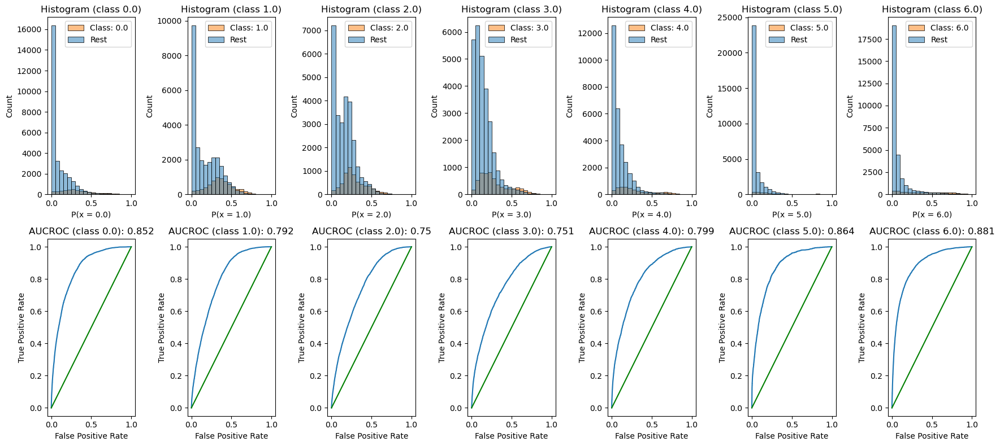

In [23]:
classes = model.classes_

bins = [i/20 for i in range(20)] + [1]

# figure width to change with number of classes
width = 15 * (len(classes)/6)

# Plots the Probability Distributions and the ROC Curves One vs Rest
plt.figure(figsize = (width, 8))
fig.suptitle(f'K-fold {k}')
roc_auc_ovr = {}

# With a subplot for each class
for i in range(len(classes)):

    # Gets the class
    c = classes[i]
    
    # Prepares an auxiliar dataframe to help with the plots
    df_aux = pd.DataFrame()
    df_aux['class'] = [1 if y == c else 0 for y in y_test]
    df_aux['prob'] = y_probs[:, i]
    df_aux = df_aux.reset_index(drop = True)
    
    # Calculates the ROC AUC OvR
    roc_auc_ovr[c] = roc_auc_score(df_aux['class'], df_aux['prob'])

    # Plots the probability distribution for the class and the rest
    ax = plt.subplot(2, len(classes), i+1)
    sns.histplot(x = "prob", data = df_aux, hue = 'class', color = 'b', 
                    ax = ax, bins = bins)
    ax.set_title(f'Histogram (class {c})')
    ax.legend([f"Class: {c}", "Rest"])
    ax.set_xlabel(f"P(x = {c})")
    
    # Calculates the ROC Coordinates and plots the ROC Curves
    ax_bottom = plt.subplot(2, len(classes), i+len(classes)+1)
    tpr, fpr = get_all_roc_coordinates(df_aux['class'], df_aux['prob'])
    plot_roc_curve(tpr, fpr, scatter = False, ax = ax_bottom)
    ax_bottom.set_title(
                f'AUCROC (class {c}): {round(roc_auc_ovr[c],3)}')
    
plt.tight_layout()

# Save
filename = os.path.join(paths.image_save_path, (paths.notebook + 
                paths.model_text + '_rocauc_ovr_kfold_' + str(k) + '.jpg'))

plt.savefig(filename, dpi=300)
plt.show()


To interpret the above plots, think of the model as having 7 separate parts, each giving the probability of classifying an instance as each class (0, 1, 2, 3, 4, 5, 6).

These charts look at the performance of each of the model parts in isolation.

Left hand graph: Showing the probability of the model classifying an instance as class 0, for all of the instances that are a 0 (orange), for all the instances that are not 0 (blue). The blues are made up of the classes 1, 2, 3, 4, 5, 6.

Right hand graph: Showing the probability of the model classifying an instance as class 6, for all of the instances that are a 6 (orange), for all the instances that are not 6 (blue). The blues are made up of the classes 0, 1, 2, 3, 4, 5.

The model does not use a set threshold to determine the classification from a single graph (as in a binary label model). It instead classifies instances based on the class that has the maximum probability for that instance.

Therefore, for the LHS graph we can not know which of the instances end up getting a class 0 classification, as the threshold will differ for each instnace. So an orange point with 0.3 probability may get a 0 classification, and another orange point with 0.3 probability may not get a 0 classification.

Using ROC AUC to choose the features means we are choosing the feature which best differentiates each class from the others (a mean across all classes). It is not showing a model that has the best prediction (as it is not comparing the probabilities across the 7 classes).

The blue histogram in the OvR graphs represents the other 6 classes. When perform OvO the orange distribution is the same across all the graphs, but the blue is filtered to show just one of the other classes. Summing up all the OvR blue bits will give the OvO graph.

(see end of notebook for the OvO graphs)

## Section 2: Calibration and assessment of accuracy when model has high confidence.

To test for callibration, look at each output classification separately, take all of the instances and group them based on the probability for that classification as given by the model. See how many are that classification. For example, all of the instances that the model gives a probability in the range 0.2 to 0.3, in a well callibrated model between 0.2 to 0.3 of these instances would be this category).

For a multiclass classification model, we calculate the calibration for each class.

Need to get the probability for the true category per instance.

Define function to plot line per kfold data in dataframe

In [24]:
def plot_results(reliability_collated, c, ax, title_text=""):
    """
    reliability_collated (dataframe): Contains 3 columns per bin
    c (string): The classification category (used in the plot title)
    ax (matplotlib axis object):  
    """

    # Plot the confidence vs fraction positive
    x = reliability_collated['confidence']
    y = reliability_collated['fraction_positive']
    ax.plot(x,y, color='orange')

    # Add 1:1 line
    ax.plot([0,1],[0,1], color='k', linestyle ='--')

    # Refine plot
    ax.set_xlabel('Model probability')
    ax.set_ylabel('Fraction positive')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_title(f'Predicting mRS{round(c)}\n{title_text}')

    return(ax)

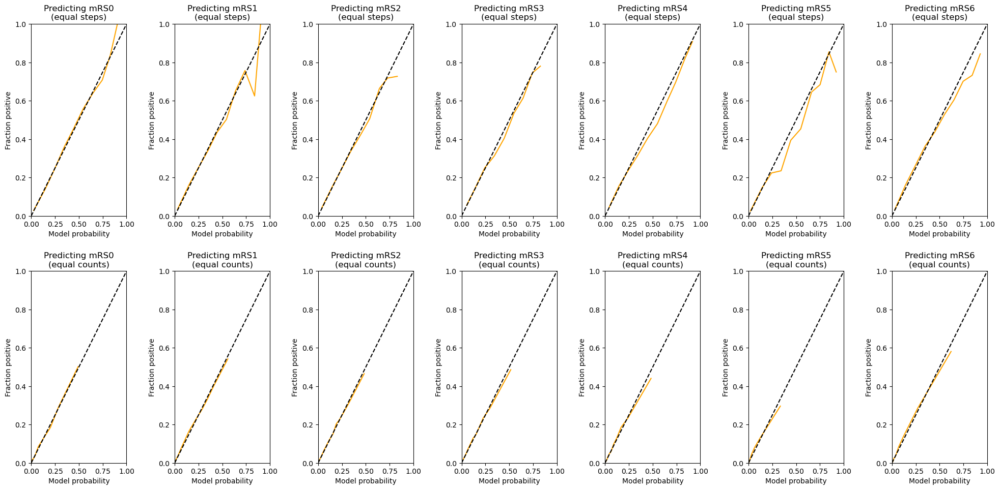

In [25]:
# Setup dictionary to store dataframes of results
dict_results = dict()

fig = plt.figure(figsize=(20,10))

col = 0
subplot = 0
for bin_method in ['steps', 'counts']:
    col = 0
    for c in class_names:
        # Collate results for each class in a Dataframe
        reliability_collated = pd.DataFrame()

        # Get observed class
        observed = y_test
        # And convert to binary for this class (1 = in class, 0 = rest)
        observed_binary = observed == c

        # Probability for current class and kfold, for all instances
        prob_observed = y_probs[:,col]
        # Determine the models classification of each instance
        classification = np.argmax(y_probs, axis=1)
#       classification = 1 * (prob_observed > 0.5 )
        
        if bin_method == 'steps':
            # Bin data with numpy digitize (this will assign a bin to each instance 
            # based on the probability assigned by the model)
            # Create bins with equal steps
            step = 0.10
            bins = np.arange(step, 1+step, step)
            digitized = np.digitize(prob_observed, bins)
        elif bin_method == 'counts':
            # Create bins with equal counts (ensure a good number of instances in each bin)
            (res, bins) = pd.qcut(prob_observed, q=10, retbins=True)
            digitized = np.digitize(prob_observed, bins)

        # Put single fold data in DataFrame
        reliability = pd.DataFrame()
        reliability['bin'] = digitized
        reliability['probability_observed'] = prob_observed
        reliability['observed'] = observed_binary
        reliability['classification'] = classification
        reliability['correct'] = observed == classification
        reliability['count'] = 1
        reliability['class'] = c

        # Summarise data by bin in new dataframe
        reliability_summary = pd.DataFrame()

        # Add bins and k-fold to summary
        reliability_summary['bin'] = bins
        reliability_summary['bin_nominal'] = np.array(range(len(bins)))
        reliability_summary['k-fold'] = k

        # Calculate mean of predicted probability of correct category in each bin
        reliability_summary['confidence'] = \
            reliability.groupby('bin').mean()['probability_observed']

        # Calculate the proportion of patients in this class
        reliability_summary[f'fraction_positive'] = \
            reliability.groupby('bin').mean()['observed']

        # Calculate proportion correct in each bin
        reliability_summary['fraction_correct'] = \
            reliability.groupby('bin').mean()['correct']

        # Calculate fraction of results in each bin
        reliability_summary['fraction_results'] = \
            reliability.groupby('bin').sum()['count'] / reliability.shape[0]

        # Add k-fold results to DataFrame collation
        reliability_collated = reliability_collated.append(reliability_summary)

        # Get probability from next column (for next class)
        col += 1
        subplot += 1

        # Get mean results
        reliability_summary = reliability_collated.groupby('bin').mean()
        reliability_summary.drop('k-fold', axis=1, inplace=True)
    
        # Plot predicted prob vs fraction psotive
        ax = fig.add_subplot(2,n_classes,subplot)

        plot_results(reliability_collated, c, ax, f"(equal {bin_method})")

        plt.tight_layout(pad=2)

        # Store in dictionary
        dict_results[f'reliability_collated_{bin_method}_{c}'] = (
                                                        reliability_collated)
        dict_results[f'reliability_summary_{bin_method}_{c}'] = (
                                                        reliability_summary)

Show example of the dataframes created, one for each class, for each split method (by count, or by steps)

In [26]:
bin_method = 'counts'
c = class_names[0]
reliability_summary = dict_results[f'reliability_summary_{bin_method}_{c}']
reliability_summary


,bin_nominal,confidence,fraction_positive,fraction_correct,fraction_results
bin,,,,,
0.000023,0.0,NaN,NaN,NaN,NaN
0.002559,1.0,0.001181,0.001782,0.567271,0.10000
0.007184,2.0,0.004702,0.005940,0.471636,0.10000
0.015145,3.0,0.010877,0.016335,0.451440,0.10000
0.028370,4.0,0.021290,0.021978,0.437481,0.10000
0.051922,5.0,0.038863,0.036234,0.407781,0.10000
0.100750,6.0,0.073609,0.084348,0.386100,0.10000
0.164578,7.0,0.132131,0.131571,0.372735,0.10000
0.239029,8.0,0.200315,0.184437,0.368577,0.10000


In [27]:
reliability_collated = dict_results[f'reliability_collated_{bin_method}_{c}']
reliability_collated

,bin,bin_nominal,k-fold,confidence,fraction_positive,fraction_correct,fraction_results
0,0.000023,0,0,NaN,NaN,NaN,NaN
1,0.002559,1,0,0.001181,0.001782,0.567271,0.10000
2,0.007184,2,0,0.004702,0.005940,0.471636,0.10000
3,0.015145,3,0,0.010877,0.016335,0.451440,0.10000
4,0.028370,4,0,0.021290,0.021978,0.437481,0.10000
5,0.051922,5,0,0.038863,0.036234,0.407781,0.10000
6,0.100750,6,0,0.073609,0.084348,0.386100,0.10000
7,0.164578,7,0,0.132131,0.131571,0.372735,0.10000
8,0.239029,8,0,0.200315,0.184437,0.368577,0.10000
9,0.342423,9,0,0.285695,0.290763,0.364716,0.10000


Calculate reliability, and plot alongside the calibration results for each class (using bins as defined as 1. equal steps 2. equal counts)

Results for class 0.0


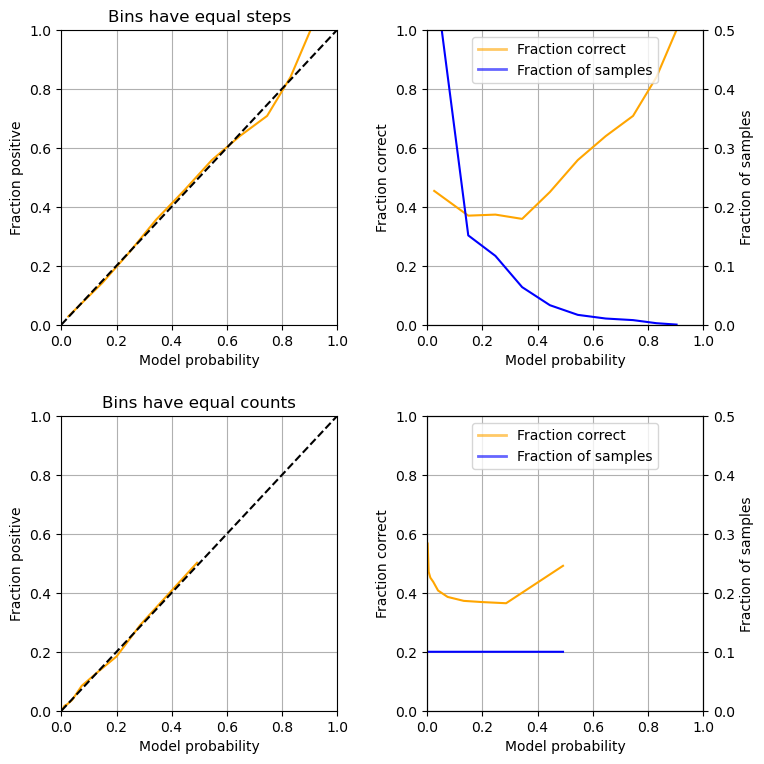

Results for class 1.0


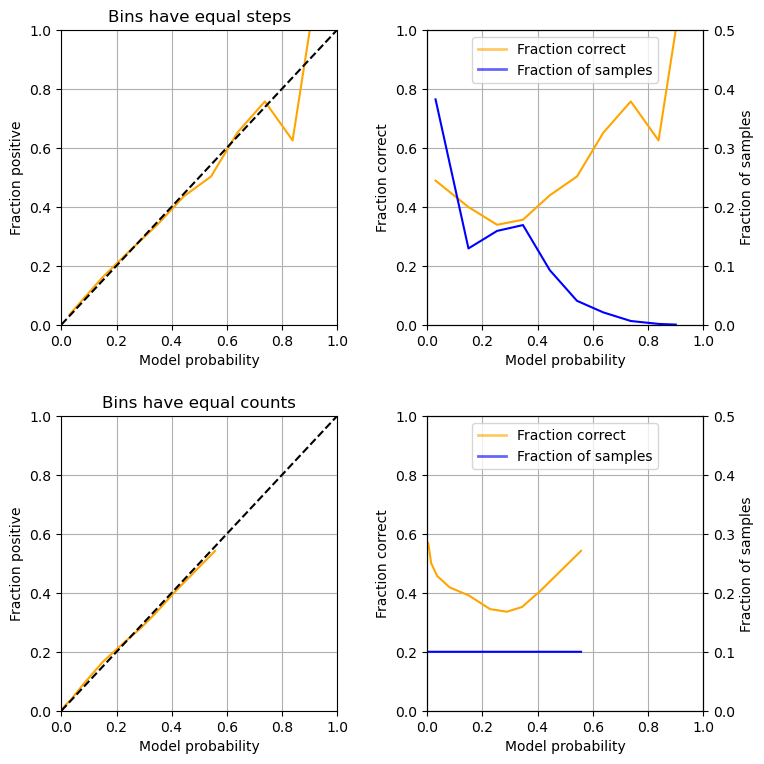

Results for class 2.0


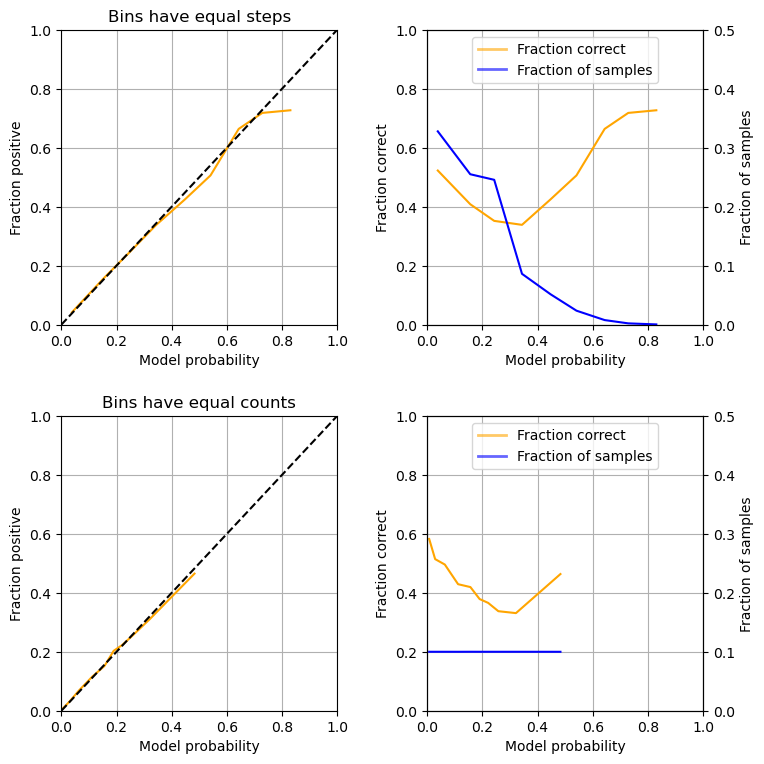

Results for class 3.0


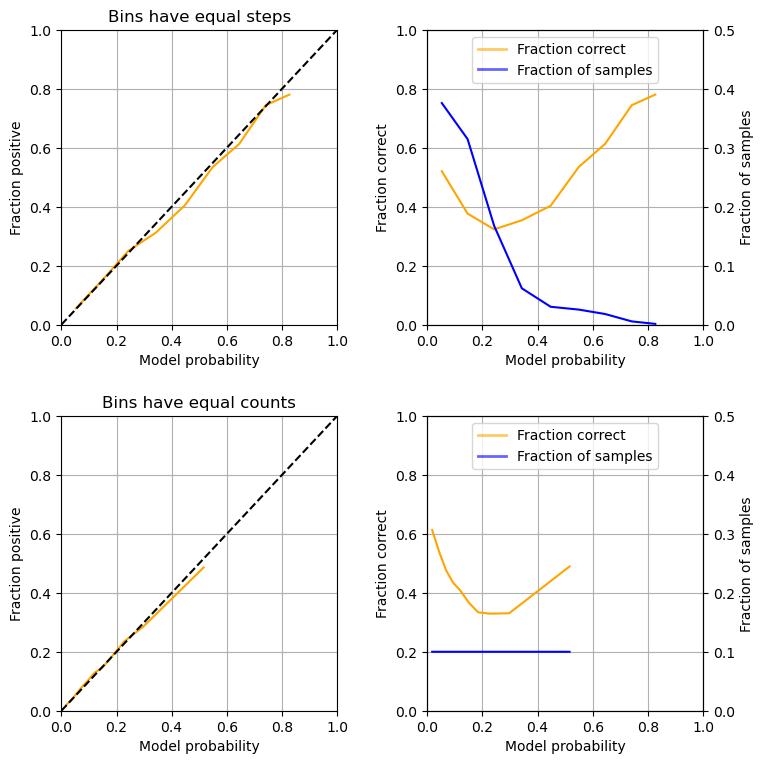

Results for class 4.0


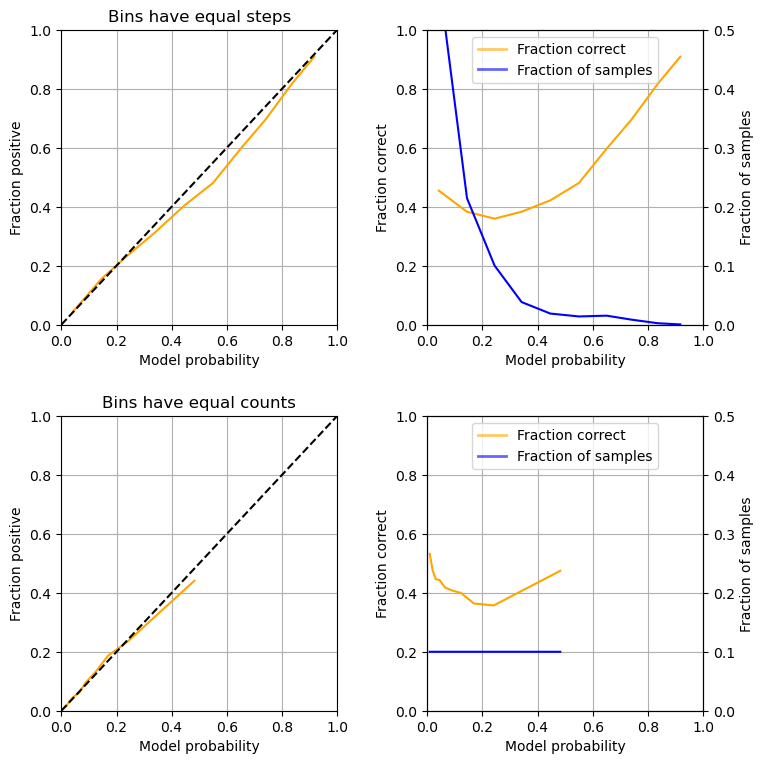

Results for class 5.0


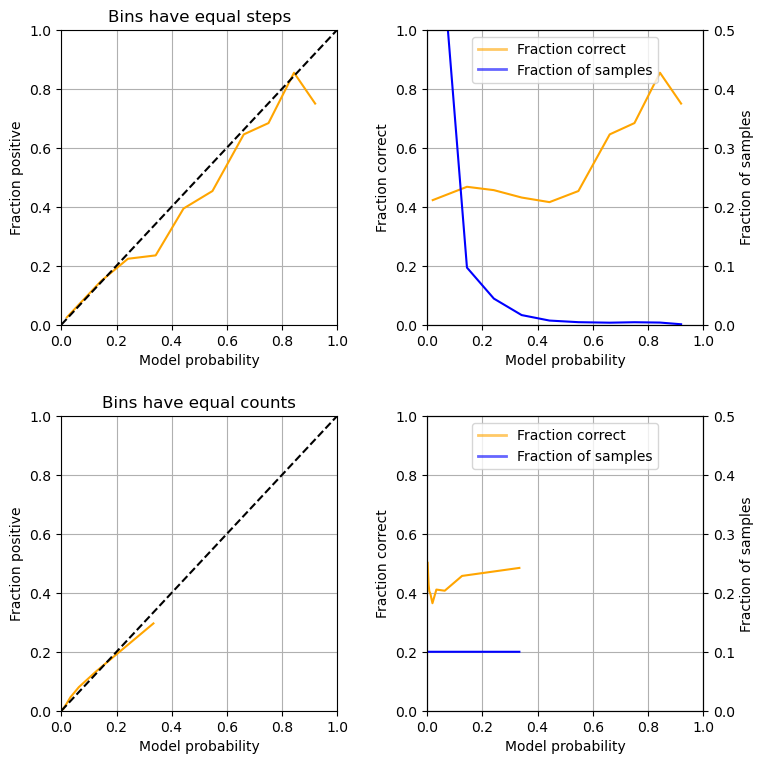

Results for class 6.0


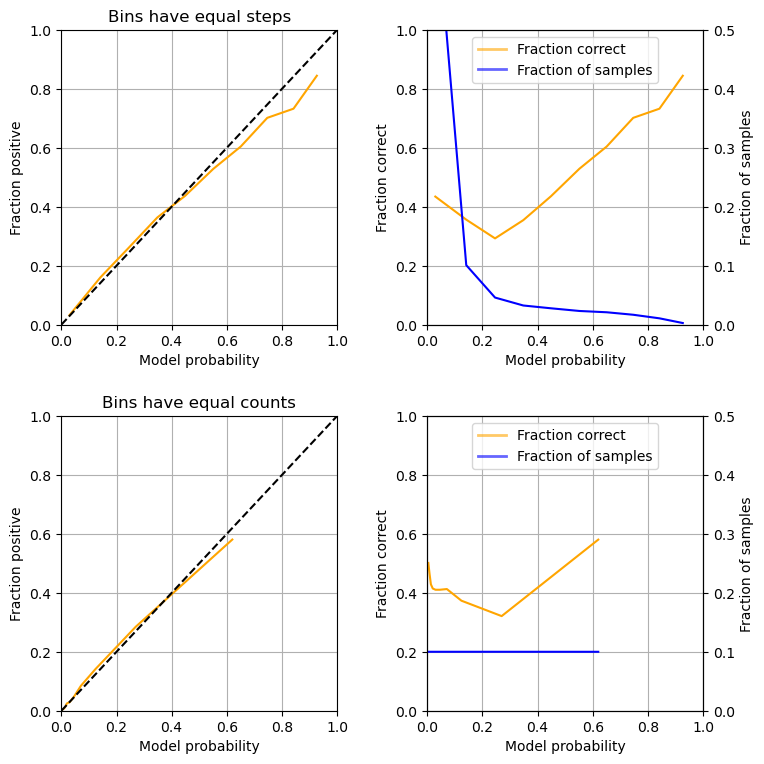

In [28]:
for c in class_names:
    subplot = 0
    print(f'Results for class {c}')

    fig = plt.figure(figsize=(8,8))

    for bin_method in ['steps', 'counts']:
        reliability_collated = (
                    dict_results[f'reliability_collated_{bin_method}_{c}'])

        # Plot predicted prob vs fraction psotive
        subplot+=1
        ax1 = fig.add_subplot(2,2,subplot)

        x = reliability_collated['confidence']
        y = reliability_collated['fraction_positive']
        ax1.plot(x,y, color='orange')
        # Add 1:1 line
        ax1.plot([0,1],[0,1], color='k', linestyle ='--')
        # Refine plot
        ax1.set_xlabel('Model probability')
        ax1.set_ylabel('Fraction positive')
        ax1.set_title(f'Bins have equal {bin_method}')
        ax1.set_xlim(0, 1)
        ax1.set_ylim(0, 1)

        subplot+=1
        # Plot accuratest_data[k]cy vs probability
        ax2 = fig.add_subplot(2,2,subplot)
        x = reliability_collated['confidence']
        y = reliability_collated['fraction_correct']
        ax2.plot(x,y, color='orange')
        # Refine plot
        ax2.set_xlabel('Model probability')
        ax2.set_ylabel('Fraction correct')
        ax2.set_xlim(0, 1)
        ax2.set_ylim(0, 1)

        # instantiate a second axes that shares the same x-axis
        ax3 = ax2.twinx()  
        x = reliability_collated['confidence']
        y = reliability_collated['fraction_results']
        ax3.plot(x,y, color='blue')
            
        ax3.set_xlim(0, 1)
        ax3.set_ylim(0, 0.5)
        ax3.set_ylabel('Fraction of samples')

        custom_lines = [Line2D([0], [0], color='orange', alpha=0.6, lw=2),
                        Line2D([0], [0], color='blue', alpha = 0.6,lw=2)]

        ax1.grid()
        ax2.grid()

        plt.legend(custom_lines, ['Fraction correct', 'Fraction of samples'],
                loc='upper center')

    plt.tight_layout(pad=2)
    filename = os.path.join(paths.image_save_path, (paths.notebook + 
                    paths.model_text + f'reliability_class_{c}.jpg'))

    plt.savefig(filename, dpi=300)
    plt.show()

### Reliability.

What's the accuracy of model, when model is at least 80% confident?

Look at the model predicting if instance is a class 0, using bin method Equal Steps.

In [29]:
c = 0.0
bin_method = 'steps'
reliability_summary = (dict_results[f'reliability_summary_{bin_method}_{c}'])
reliability_summary

,bin_nominal,confidence,fraction_positive,fraction_correct,fraction_results
bin,,,,,
0.1,0.0,0.024915,0.027684,0.453661,0.598634
0.2,1.0,0.148422,0.141484,0.369702,0.151351
0.3,2.0,0.246889,0.245860,0.373248,0.116573
0.4,3.0,0.343825,0.356376,0.358711,0.063588
0.5,4.0,0.444528,0.454463,0.449955,0.032937
0.6,5.0,0.545702,0.558348,0.558348,0.016543
0.7,6.0,0.647252,0.639769,0.639769,0.010306
0.8,7.0,0.746161,0.708171,0.708171,0.007633
0.9,8.0,0.830765,0.839506,0.839506,0.002406


In [30]:
print ('For instances with at least 80% confidence from model')
print ()
for c in class_names:
    reliability_summary = (
                        dict_results[f'reliability_summary_steps_{c}'])

    bins = [0.9, 1.0]
    frac = reliability_summary.loc[bins].sum()['fraction_results']
    acc = ((reliability_summary.loc[bins]['fraction_correct'] * 
            reliability_summary.loc[bins]['fraction_results']).sum()/frac)

    print (f'PREDICTING CLASS: {round(c)}')
    print (f'Proportion of instances with >80% confidence: {frac:0.3f}')
    print (f'Accuracy for instances with >80% confidence: {acc:0.3f}')
    print ()

For instances with at least 80% confidence from model

PREDICTING CLASS: 0
Proportion of instances with >80% confidence: 0.002
Accuracy for instances with >80% confidence: 0.841

PREDICTING CLASS: 1
Proportion of instances with >80% confidence: 0.001
Accuracy for instances with >80% confidence: 0.634

PREDICTING CLASS: 2
Proportion of instances with >80% confidence: 0.000
Accuracy for instances with >80% confidence: 0.727

PREDICTING CLASS: 3
Proportion of instances with >80% confidence: 0.001
Accuracy for instances with >80% confidence: 0.780

PREDICTING CLASS: 4
Proportion of instances with >80% confidence: 0.003
Accuracy for instances with >80% confidence: 0.830

PREDICTING CLASS: 5
Proportion of instances with >80% confidence: 0.004
Accuracy for instances with >80% confidence: 0.839

PREDICTING CLASS: 6
Proportion of instances with >80% confidence: 0.013
Accuracy for instances with >80% confidence: 0.755



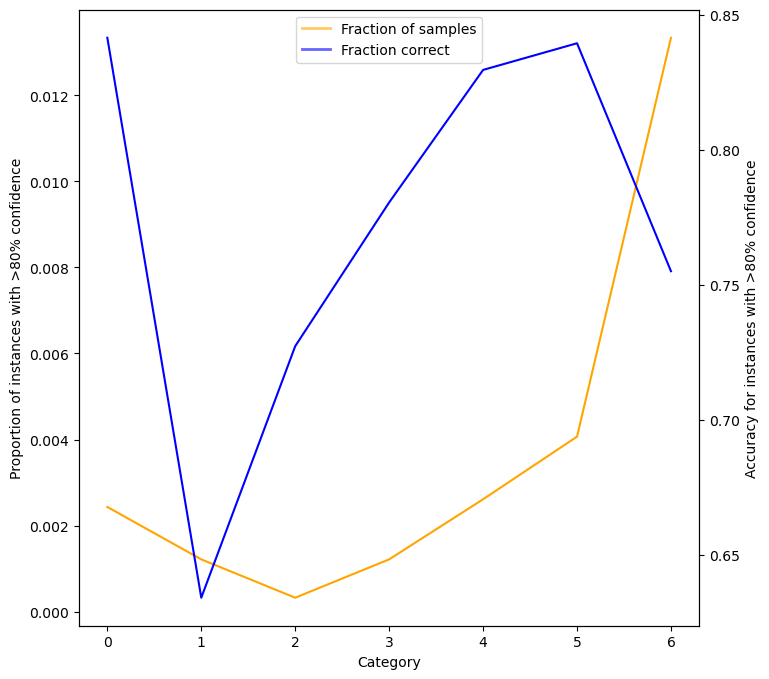

In [31]:
frac = []
acc = []

for c in class_names:
    reliability_summary = (
                        dict_results[f'reliability_summary_steps_{c}'])

    bins = [0.9, 1.0]
    frac.append(reliability_summary.loc[bins].sum()['fraction_results'])
    acc.append((reliability_summary.loc[bins]['fraction_correct'] * 
            reliability_summary.loc[bins]['fraction_results']).sum()/frac[-1])

fig = plt.figure(figsize=(8,8))

# Plot accuracy vs probability
ax1 = fig.add_subplot(1,1,1)
ax1.plot(class_names,frac, color='orange')

# Refine plot
ax1.set_xlabel('Category')
ax1.set_ylabel('Proportion of instances with >80% confidence')

# instantiate a second axes that shares the same x-axis
ax2 = ax1.twinx()  
ax2.plot(class_names, acc, color='blue')
        
ax2.set_ylabel('Accuracy for instances with >80% confidence')

custom_lines = [Line2D([0], [0], color='orange', alpha=0.6, lw=2),
                Line2D([0], [0], color='blue', alpha = 0.6,lw=2)]

plt.legend(custom_lines, ['Fraction of samples', 'Fraction correct'],
        loc='upper center')

plt.show()

https://towardsdatascience.com/explainable-ai-xai-with-shap-multi-class-classification-problem-64dd30f97cea

https://github.com/Iditc/Posts-on-Medium/blob/main/Explainable%20AI/Explainable%20AI%20(XAI)%20with%20SHAP_MultiClass%20Classification%20Problem.ipynb

https://github.com/slundberg/shap/issues/367


## Section 3: Feature contribution (feature importance and SHAP)

### Feature Importances

Get XGBoost feature importances (average across k-fold results)

It seems that the built in feature importance is not returned per class, so analyse it in the same way as if a binary classification model
https://stackoverflow.com/questions/58603632/how-to-get-feature-importance-for-each-class-in-mutliclass-classification-with-x)

XGBoost algorithm provides a metrc per feature called "feature importance". It does not provide this value with respoect ot the output class, just a single value.

Examine the consitency of feature importances across k-fold splits.

A model is fitted to each k-fold split, and feature importance values are obtained for each model (but not for each output class). 

This next section assesses the range of feature importance values for each feature across the k-fold splits.

Create (and show) a dataframe that stores the min, median, and max feature importance value for each feature across the 5 k-fold splits

In [32]:
df_feature_importance = pd.DataFrame(index=feature_names_ohe)

df_feature_importance['Importance'] = feature_importance

# Sort by importance (weight)
df_feature_importance.sort_values(by='Importance', ascending=False, inplace=True)

# Save
filename = (f'{paths.image_save_path}{paths.notebook}_{paths.model_text}'
            f'_feature_importance.csv')
df_feature_importance.to_csv(filename)

# Display top 25
df_feature_importance.head(25)

,Importance
prior_disability,0.042477
team_Royal Stoke University Hospital,0.033812
nihss_arrival_loc,0.033748
team_Salford Royal Hospital,0.022300
nihss_arrival_best_gaze,0.020550
team_University Hospital of North Durham,0.019663
team_Leicester Royal Infirmary,0.016056
team_Sandwell District Hospital,0.015991
team_Royal Hallamshire Hospital,0.015534
team_Derriford Hospital,0.015103


Graph of % stroke team for the top n feautres

In [33]:
# Create a mask for feature names that don't contain string "team"
mask_exclude_team = ['team' not in i for i in list(df_feature_importance.index)]
mask_team = ['team' in i for i in list(df_feature_importance.index)]

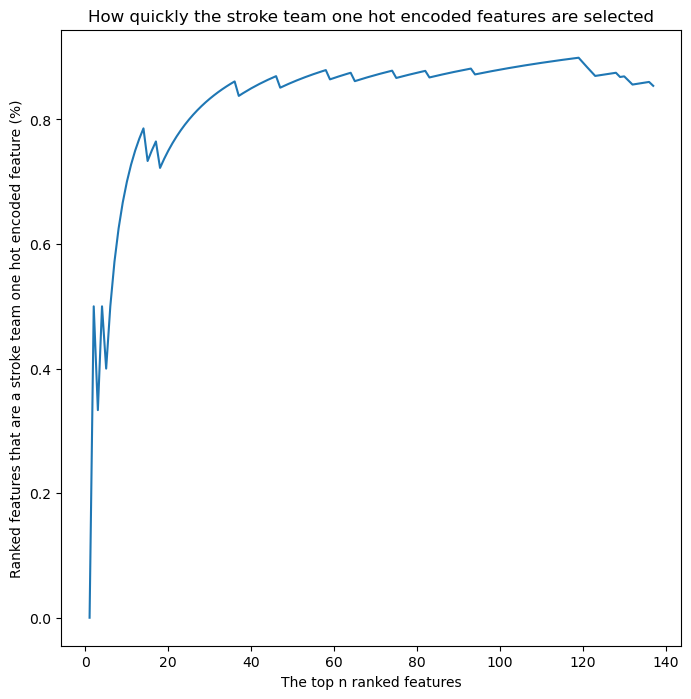

In [34]:
list_pc_team_feature = [sum(mask_team[:i+1])/(i+1) for i in range(n_features_ohe-1)]

fig = plt.figure(figsize=(8,8))

plt.plot(list(range(1,n_features_ohe,1)), list_pc_team_feature)
plt.title('How quickly the stroke team one hot encoded features are selected')
plt.xlabel('The top n ranked features')
plt.ylabel('Ranked features that are a stroke team one hot encoded feature (%)')

filename = os.path.join(paths.image_save_path, (paths.notebook + 
                    paths.model_text + 
                    'percent_team_ohe_features_ranked_importance.jpg'))
plt.savefig(filename, dpi=300)

plt.show()

Create a bar chart for the XGBoost feature importance values
(create one excluding the stroke team one hot encoded features)

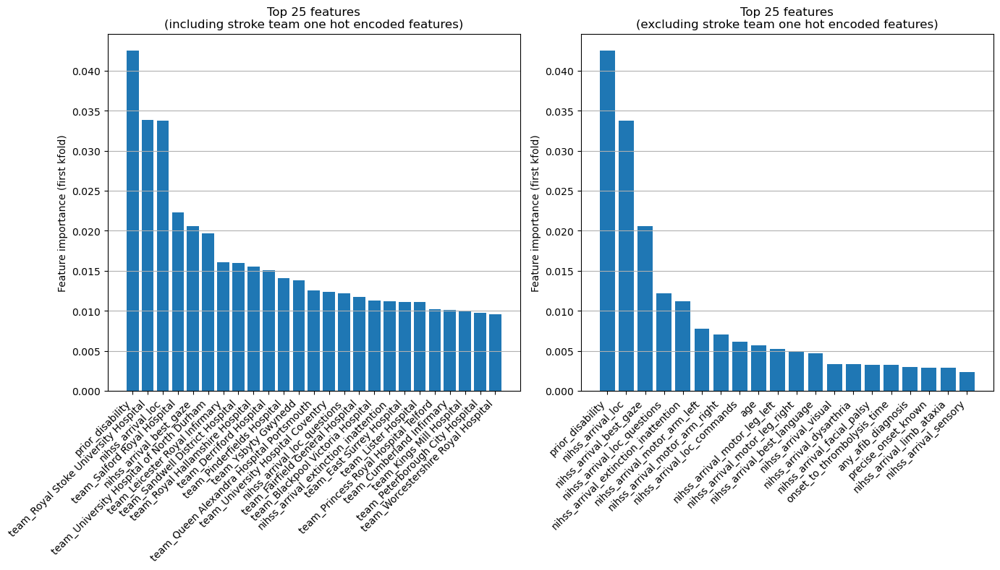

In [35]:
# Number of ranked features to show in plot
n_features_show = 25

# Set plot width based on number of features to show
width = 14 * (n_features_show/25)

# Set up figure
fig = plt.figure(figsize=(width,8))

# Set up list of masks.
# First mask includes all features. Second mask excludes stroke team ohe
list_mask = [[True] * n_features_ohe, mask_exclude_team]
list_title = ['Top 25 features\n(including stroke team one hot encoded features)', 
              'Top 25 features\n(excluding stroke team one hot encoded features)']

# Set up two subplots
for subplot in range(2):
    features_show = (list(df_feature_importance[list_mask[subplot]].head(n_features_show).index))

    ax1 = fig.add_subplot(1,2,subplot+1)

    ax1.bar(features_show,
            df_feature_importance.loc[features_show].T.values[0])
    ax1.set_ylim(0)
    ax1.set_xticks(np.arange(0, len(features_show)))
    ax1.set_xticklabels(features_show, rotation=45, ha='right')
    ax1.grid(which='both', axis='y')
    ax1.set_ylabel('Feature importance (first kfold)')
    ax1.set_title(list_title[subplot])

plt.tight_layout()

# Save figure
filename = os.path.join(paths.image_save_path, (paths.notebook + 
                    paths.model_text + 'feature_weights_bar.jpg'))

plt.savefig(filename, dpi=300)

plt.show()

### SHAP values
SHAP values give the contribution that each feature has on the models prediction, per instance. A SHAP value is returned for each feature, for each instance.

We will use the shap library: https://shap.readthedocs.io/en/latest/index.html

'Raw' SHAP values from XGBoost model are log odds ratios. A SHAP value is returned for each feature, for each instance, for each model (one per k-fold)

TreeExplainer is a fast and exact method to estimate SHAP values for tree models and ensembles of trees. Using this we can calculate the SHAP values.

Create function to return SHAP values extension X and y data for train and test sets (either load from pickle if file exists, or calculate).

In [36]:
def calculate_shap_extended(model, k, X_train, X_test):
    """
    TreeExplainer is a fast and exact method to estimate SHAP values for tree 
    models and ensembles of trees. Using this we can calculate the SHAP values.

    Either load from pickle (if file exists), or calculate.

    Args:
        model [xgboost classification model object]: xgboost object
        k [integer]: kfold number
        X_train [dataframe]: training set (used as background data)
        X_test [dtaframe]: test set (to calculate the SHAP values for)

    Return:
        shap_values_extended [dictionary]: the extended shap values (contains 
                    .values, .base, and .data)
        
    """

    # Set filename
    filename = os.path.join(paths.data_save_path, 
                            (paths.notebook + paths.model_text + 
                             '_shap_values_extended_' + str(k) + '.p'))
    # Check if exists
    file_exists = exists(filename)

    if file_exists:
        # Load explainer
        with open(filename, 'rb') as filehandler:
            shap_values_extended = pickle.load(filehandler)
    else:
        # Calculate SHAP values
        
        # Set up explainer using the model and feature values from training set
        explainer = shap.TreeExplainer(model, X_train)

        # Get (and store) Shapley values along with base and feature values
        shap_values_extended = explainer(X_test)

        explainer_filename = os.path.join(paths.data_save_path, 
                            (paths.notebook + paths.model_text + 
                             '_shap_explainer_' + str(k) + '.p'))

        # Save explainer using pickle
        with open(explainer_filename, 'wb') as filehandler:
            pickle.dump(explainer, filehandler)
            
        # Save shap values extended using pickle
        with open(filename, 'wb') as filehandler:
            pickle.dump(shap_values_extended, filehandler)
        
    return(shap_values_extended)

In [37]:
# Get and store SHAP values
shap_values_extended = (calculate_shap_extended(model, k, X_train, X_test))
shap_values = shap_values_extended.values   

### Get average SHAP values for this k-fold
Calculate the mean SHAP value for each feature (across all instances), for each of the 7 disability discharge output values.

The mean is calculated in three ways:
1. mean of raw values
1. mean of absolute values
1. absolute of mean of raw values

In a separate dataframe (df_mean_abs_shap), store the mean of the absolute SHAP values for this kfold (a row per feature). A dataframe per output class.

In [38]:
# Initialise dictionary. Key name is output_class. Holds a list for dataframes
# for that class (for each kfold). The dataframe has a row per feature and a 
# column for the average SHAP values across all of the instances
dict_mean_abs_shap = {}

# For each output class
for c in range(n_classes):

    # Initialise DataFrame (stores mean of the absolute SHAP values for each kfold)
    df_mean_abs_shap = pd.DataFrame()

    # Calculate mean SHAP value for each feature (across all instances), for
    # this class
    shap_values_class = shap_values[:,:,c]
    df_shap_values_mean = pd.DataFrame(index=feature_names_ohe)
    df_shap_values_mean['mean_shap'] = np.mean(shap_values_class, axis=0)
    df_shap_values_mean['abs_mean_shap'] = np.abs(df_shap_values_mean['mean_shap'])
    df_shap_values_mean['mean_abs_shap'] = np.mean(np.abs(shap_values_class), axis=0)
    df_shap_values_mean['rank_mean_abs_shap'] = (
            df_shap_values_mean['mean_abs_shap'].rank(ascending=False).values)
    df_shap_values_mean.sort_values(by='rank_mean_abs_shap', inplace=True)
    
    # Store the mean of the absolute SHAP values in a dataframe 
    # The 3 columns (min, median, max) that were in df_mean_abs_shap_summary are now in df_mean_abs_shap
    # Store the dataframe for this class (row per feature, column per kfold (and summary statistics) for SHAPs across all instances)
    dict_mean_abs_shap[f'class{c}'] = df_shap_values_mean['mean_abs_shap']

For each output class, identify the 10 features with the highest SHAP values (in terms of the median of the kfolds of the mean of the absolute SHAP values)

For each output class, identify the 15 features with the highest SHAP values (in terms of the median of the kfolds of the mean of the absolute SHAP values) and create a violin plot.

Violin plots show the distribution of the shap values for each feature across the 5 kfold splits (the shaded area show the density of the data points).

The same data in each plot, the right one excludes the stroke team one hot encoded features.

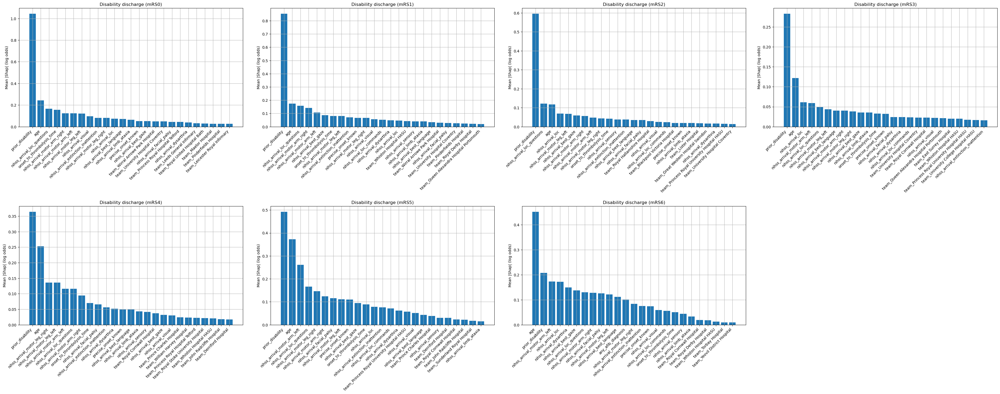

In [39]:
n_features_show = 25

width = 15 * (n_features_show/10)

fig = plt.figure(figsize=(width, 15))

for c in range(n_classes):
    # create next subplot
    ax1 = fig.add_subplot(2,4,c+1)

    # Data for the violin plot (for this class)
    df_mean_abs_shap = dict_mean_abs_shap[f'class{c}']

    # listof the top featres to include in the bar plot
    features_show = (list(df_mean_abs_shap.head(n_features_show).index))

    ax1.bar(features_show, df_mean_abs_shap.iloc[:n_features_show].T)
    ax1.set_ylim(0)
    ax1.set_title(f'Disability discharge (mRS{c})')

    labels = df_mean_abs_shap.index[:n_features_show]
    ax1.set_xticks(np.arange(0, len(labels)))
    ax1.set_xticklabels(labels, rotation=45, ha='right')
    ax1.grid(which='both')
    ax1.set_ylabel('Mean |Shap| (log odds)')

plt.subplots_adjust(bottom=0.25, wspace=0.05)
    
plt.tight_layout(pad=2)

filename = os.path.join(paths.image_save_path, 
                        (paths.notebook + paths.model_text + '_shap_violin.jpg'))

plt.savefig(filename, dpi=300, bbox_inches='tight', pad_inches=0.2)
plt.show()

The one hot encoded stroke team features are not dominating the ranked list (as in the feature importance)

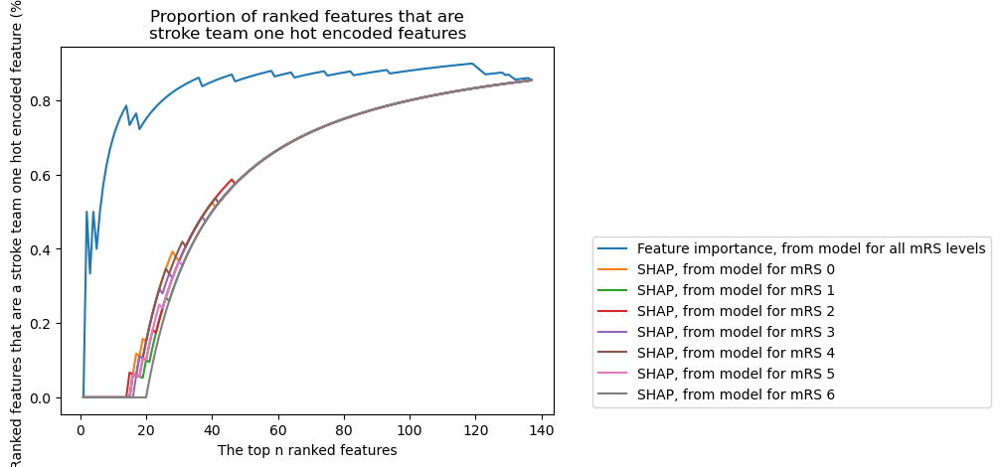

In [40]:
plt.plot(list(range(1, n_features_ohe, 1)), list_pc_team_feature, 
         label="Feature importance, from model for all mRS levels")

for c in range(n_classes):

    # Data for the violin plot (for this class)
    df_mean_abs_shap = dict_mean_abs_shap[f'class{c}']

    # Create a mask for feature names that don't contain string "team"
    mask_exclude_team_features_shap = (
                ['team' not in i for i in list(df_mean_abs_shap.index.values)])
    mask_team_features_shap = (
                ['team' in i for i in list(df_mean_abs_shap.index.values)])

    list_pc_team_feature_shap = (
        [sum(mask_team_features_shap[:i+1])/(i+1) for i in range(n_features_ohe-1)])

    plt.plot(list(range(1, n_features_ohe, 1)), 
             list_pc_team_feature_shap, label=f"SHAP, from model for mRS {c}")
#plt.xlim((0,10))
plt.title('Proportion of ranked features that are\nstroke team one hot encoded features')
plt.xlabel('The top n ranked features')
plt.ylabel('Ranked features that are a stroke team one hot encoded feature (%)')
plt.legend(loc="lower right", bbox_to_anchor=(1.9, 0))
filename = os.path.join(paths.image_save_path, 
                        (paths.notebook + paths.model_text + 
                         '_percent_team_ohe_features_ranked_importance.jpg'))
plt.savefig(filename, dpi=300)
plt.show()

### Compare top 10 SHAP and feature importance values

Compare the features (and their values) that make the top 10 when selected by either SHAP values, or feature importance values

In [41]:
df_compare_shap_importance = pd.DataFrame()
df_compare_shap_importance['Importance (feature name)'] = \
                            df_feature_importance.index
df_compare_shap_importance['Importance (median value)'] = \
                            df_feature_importance.values

for c in range(n_classes):
    # Data for the violin plot (for this class)
    df_compare_shap_importance[f'SHAP (feature name) [mRS{c}]'] = (
                            dict_mean_abs_shap[f'class{c}'].index)
    df_compare_shap_importance[f'SHAP (median value) [mRS{c}]'] = (
                            dict_mean_abs_shap[f'class{c}'].values)
               
df_compare_shap_importance.head(10)

,Importance (feature name),Importance (median value),SHAP (feature name) [mRS0],SHAP (median value) [mRS0],SHAP (feature name) [mRS1],SHAP (median value) [mRS1],SHAP (feature name) [mRS2],SHAP (median value) [mRS2],SHAP (feature name) [mRS3],SHAP (median value) [mRS3],SHAP (feature name) [mRS4],SHAP (median value) [mRS4],SHAP (feature name) [mRS5],SHAP (median value) [mRS5],SHAP (feature name) [mRS6],SHAP (median value) [mRS6]
0,prior_disability,0.042477,prior_disability,1.044396,prior_disability,0.853010,prior_disability,0.595415,prior_disability,0.283222,prior_disability,0.363920,prior_disability,0.492080,age,0.451683
1,team_Royal Stoke University Hospital,0.033812,age,0.242680,age,0.174296,nihss_arrival_loc_questions,0.121094,age,0.121980,age,0.253109,age,0.372360,prior_disability,0.207157
2,nihss_arrival_loc,0.033748,nihss_arrival_loc_questions,0.164955,nihss_arrival_loc_questions,0.158474,age,0.116882,nihss_arrival_loc,0.061232,nihss_arrival_motor_leg_right,0.136065,nihss_arrival_motor_arm_left,0.261309,nihss_arrival_motor_arm_left,0.172618
3,team_Salford Royal Hospital,0.022300,onset_to_thrombolysis_time,0.156181,nihss_arrival_motor_arm_right,0.142019,nihss_arrival_loc,0.068787,nihss_arrival_motor_arm_left,0.058988,nihss_arrival_motor_leg_left,0.135934,nihss_arrival_loc_questions,0.165687,nihss_arrival_loc,0.171769
4,nihss_arrival_best_gaze,0.020550,nihss_arrival_motor_arm_right,0.122825,nihss_arrival_motor_arm_left,0.106752,nihss_arrival_motor_leg_left,0.067639,nihss_arrival_loc_questions,0.049267,nihss_arrival_motor_arm_left,0.116267,nihss_arrival_motor_leg_right,0.146390,nihss_arrival_dysarthria,0.149222
5,team_University Hospital of North Durham,0.019663,nihss_arrival_motor_arm_left,0.122492,nihss_arrival_best_gaze,0.086587,nihss_arrival_best_gaze,0.059590,nihss_arrival_motor_leg_left,0.043917,nihss_arrival_loc_questions,0.115574,nihss_arrival_motor_arm_right,0.123695,nihss_arrival_best_gaze,0.137010
6,team_Leicester Royal Infirmary,0.016056,nihss_arrival_motor_leg_left,0.121308,onset_to_thrombolysis_time,0.080444,nihss_arrival_motor_arm_right,0.056509,nihss_arrival_best_language,0.040547,nihss_arrival_motor_arm_right,0.094269,nihss_arrival_facial_palsy,0.116169,nihss_arrival_loc_questions,0.130261
7,team_Sandwell District Hospital,0.015991,nihss_arrival_visual,0.094952,nihss_arrival_motor_leg_left,0.080423,nihss_arrival_motor_arm_left,0.047425,nihss_arrival_motor_arm_right,0.040093,onset_to_thrombolysis_time,0.070422,nihss_arrival_motor_leg_left,0.110724,nihss_arrival_motor_arm_right,0.127960
8,team_Royal Hallamshire Hospital,0.015534,nihss_arrival_extinction_inattention,0.082458,nihss_arrival_extinction_inattention,0.069760,nihss_arrival_motor_leg_right,0.044027,nihss_arrival_motor_leg_right,0.038335,nihss_arrival_facial_palsy,0.065774,precise_onset_known,0.109732,nihss_arrival_facial_palsy,0.125241
9,team_Derriford Hospital,0.015103,nihss_arrival_motor_leg_right,0.080028,precise_onset_known,0.066739,onset_to_thrombolysis_time,0.042588,nihss_arrival_best_gaze,0.035791,nihss_arrival_extinction_inattention,0.055811,nihss_arrival_best_gaze,0.094787,nihss_arrival_motor_leg_left,0.121831


Plot all of the features, showing feature importance vs SHAP values.

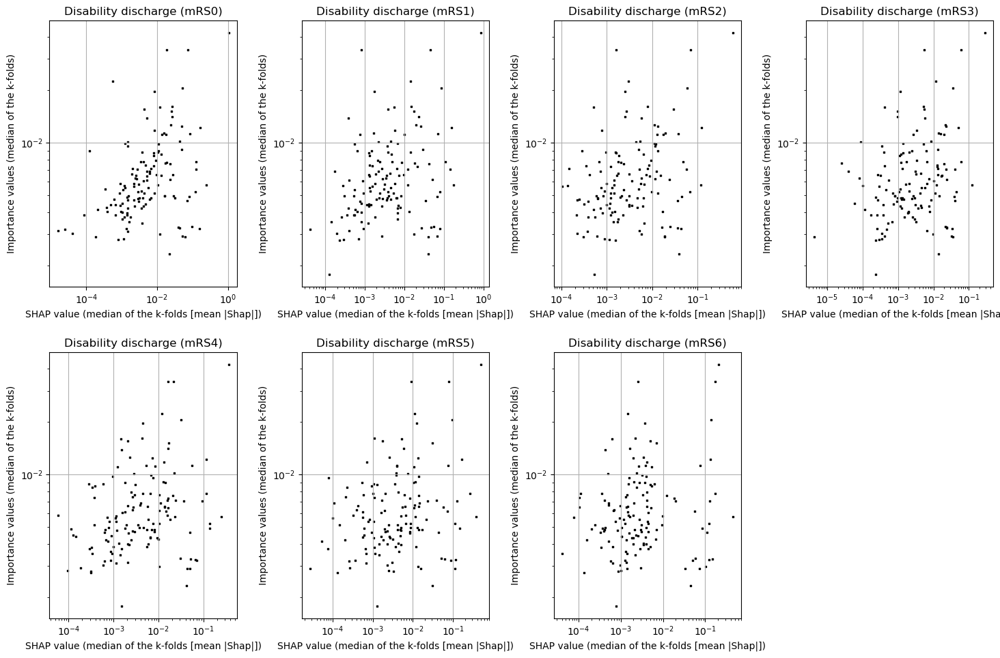

In [42]:
fig = plt.figure(figsize=(15, 10))

for c in range(n_classes):
    # Data for the violin plot (for this class)
    df_mean_abs_shap = dict_mean_abs_shap[f'class{c}']
    

    df_shap_importance = pd.DataFrame()
    df_shap_importance['Shap'] =  df_mean_abs_shap
    df_shap_importance = df_shap_importance.merge(
                        df_feature_importance, 
                        left_index=True, right_index=True)
    
    # Give the column from the series the column name "Importance"
    df_shap_importance.sort_values('Shap', inplace=True, ascending=False)

    ax1 = fig.add_subplot(2,4,c+1)
    ax1.scatter(df_shap_importance['Shap'], df_shap_importance['Importance'], 
                c='k', marker='s', s=1)
    ax1.set_title(f'Disability discharge (mRS{c})')
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlabel('SHAP value (median of the k-folds [mean |Shap|])')
    ax1.set_ylabel('Importance values (median of the k-folds)')
    ax1.grid()

plt.subplots_adjust(bottom=0.25, wspace=0.05)

plt.tight_layout(pad=2)

filename = os.path.join(paths.image_save_path, 
                        (paths.notebook + paths.model_text + 
                         '_shap_importance_correlation.jpg'))

plt.savefig(filename, dpi=300)
plt.show()

Show summary SHAP plot for the first kfold.

Shows the mean absolute SHAP for each feature for each class output.

Need to reformat the SHAP values (as they contain multiclass output) into a list, with the SHAP value array for each class as a separate element in the list. Otherwise, if we pass the 3D array (instance, feature, class) to shap.summary_plot, the function will assume that the 3D array contains shap interaction values. For our case the 3D array is of size (33670, 177, 7). It will create a grid of plots of each pair-wise combination of the first 7 features, and treat the values as SHAP interactions.

We instead want to have a list of length 7 (the last array dimension), an array in the list per class.

shap.summary_plot(shap_values_kfold[k], X_test.values, plot_type="bar", 
                class_names= class_names, feature_names = X_test.columns, 
                show=False, plot_size=(6,6), title=f"k-fold {k+1}")

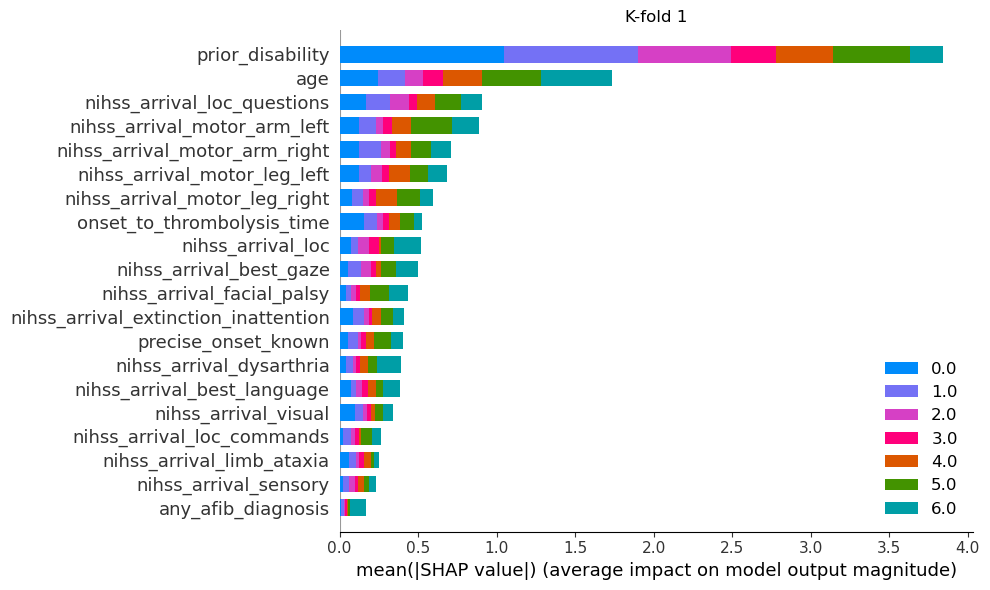

In [43]:
# Initialise empty list
shap_values_list = []
# Putting the SHAP values in the required format
for c in range(n_classes):
    shap_values_list.append(shap_values[:,:,c])

# Plot a SHAP summary plot, one for each k-fold
shap.summary_plot(shap_values_list, X_test.values, plot_type="bar", 
                    class_names=model.classes_, 
                    feature_names = X_test.columns, class_inds="original",
                    show=False, plot_size=(10,6))
plt.title(f"K-fold {k+1}")
plt.tight_layout()
plt.show()

You can also see the summary_plot of a specific class (known as a Beeswarm plot)

A Beeswarm plot shows data for all of the test instances.

The feature value for each point is shown by the colour, and its position indicates the SHAP value for that instance.

Beeswarm plots are used to get a picture of how the feature value interacts with it's SHAP value by looking at the plots of a specific class and kfold.

To note: can be visualised as either dots or violin plots. Can see how there is a difference in the visualisation depending on this choice. For first kfold, for class mRS0 can see with dot represenation that for feature age, a high age gives a SHAP value in the range from negative to zero. Whereas the violin representation gives a high age a SHAP value a lower ranges (largest value is negative, does not reach 0)

See below for the first kfold, for all of the classes

Loop through the classes.

Reminder: shap_values[instance, feature, class]

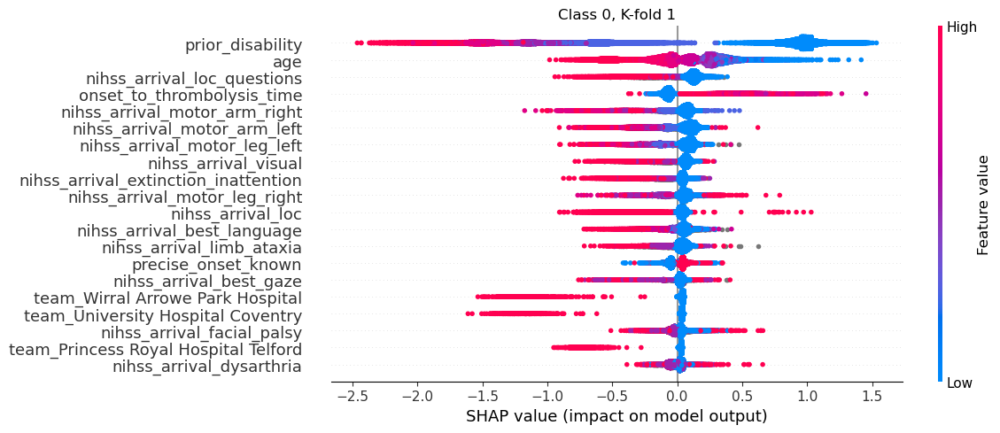

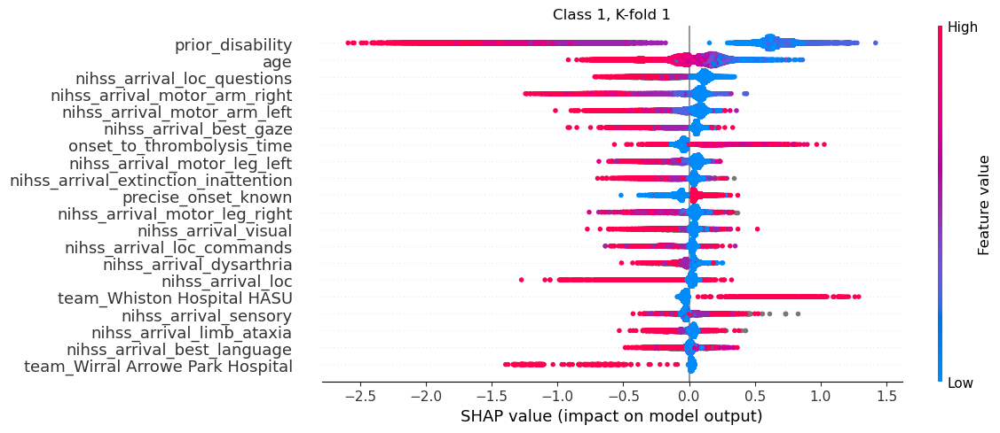

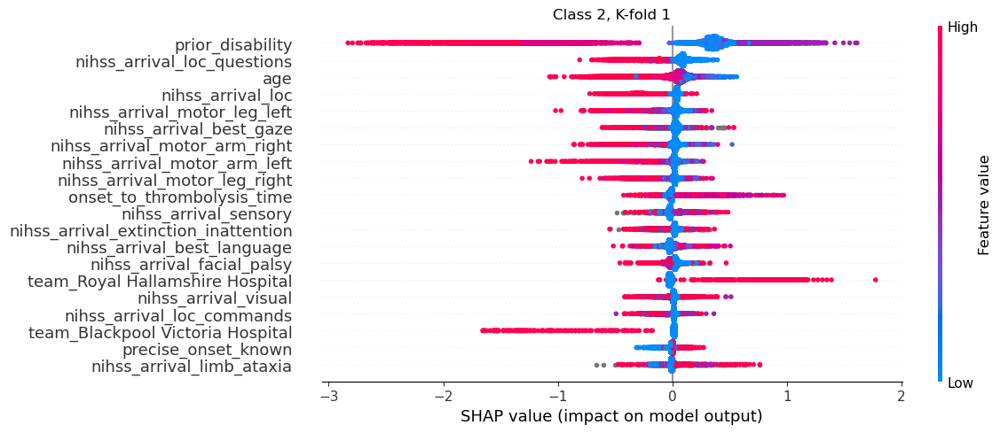

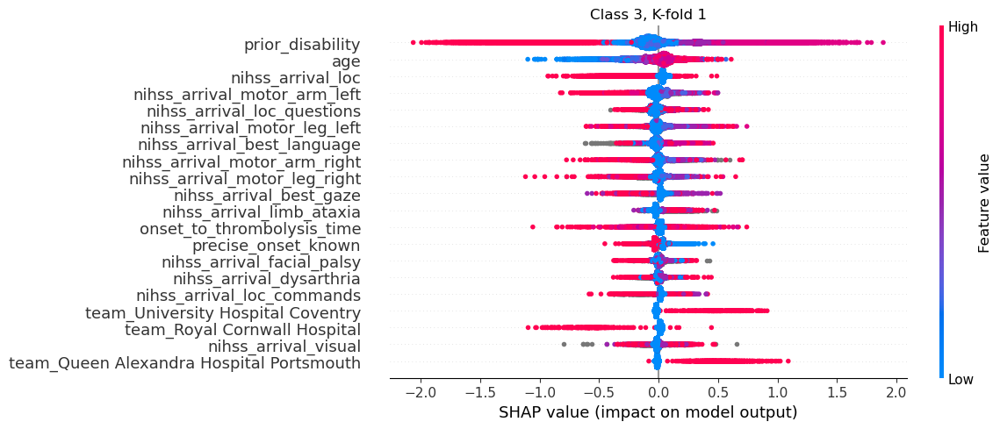

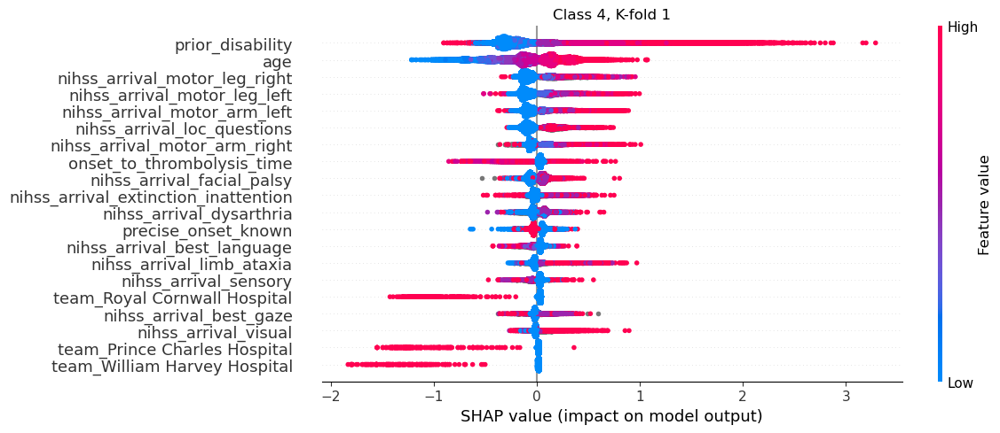

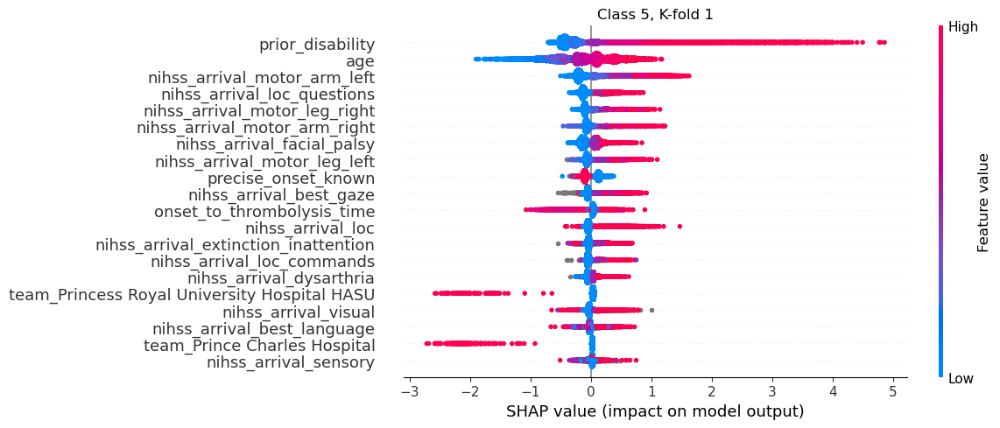

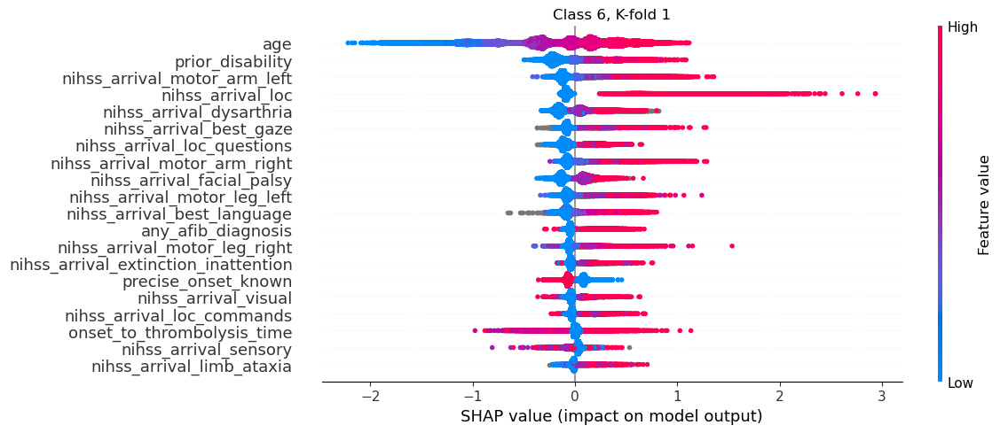

In [44]:
for c in range(len(class_names)):

    shap.summary_plot(shap_values[:,:,c], X_test.values, 
                    feature_names=X_test.columns, show=False, 
                    plot_size=(12,5))

    plt.title(f"Class {c}, K-fold {k+1}")
    plt.tight_layout()
    plt.show()

## Section 3.2: SHAP values for individual patients
SHAP values give the contribution that each feature has on the models prediction, per instance. A SHAP value is returned for each feature, for each instance, for each of the 7 output classes. We can analyse the SHAP values in a different way than if it was a binary model.

We will use the shap library: https://shap.readthedocs.io/en/latest/index.html

'Raw' SHAP values from XGBoost model are log odds ratios. A SHAP value is returned for each feature, for each instance, for each model (one per k-fold)

A resource for code to show forceplots for multiclass (found too la, already made this work): https://medium.com/mlearning-ai/shap-force-plots-for-classification-d30be430e195

Here we will show two types of plots (for an individual patient across the output classes)
1. waterfall
1. force

In [45]:
instance = 3
c = 0

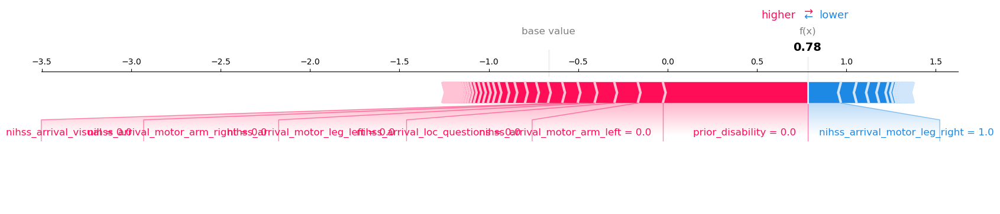

In [46]:
shap.plots.force(shap_values_extended.base_values[instance,c], 
                 shap_values=shap_values[instance,:,c], 
                 features=X_test.iloc[instance],
                 feature_names=feature_names_ohe, 
                 matplotlib=True)

SHAP waterfall plot

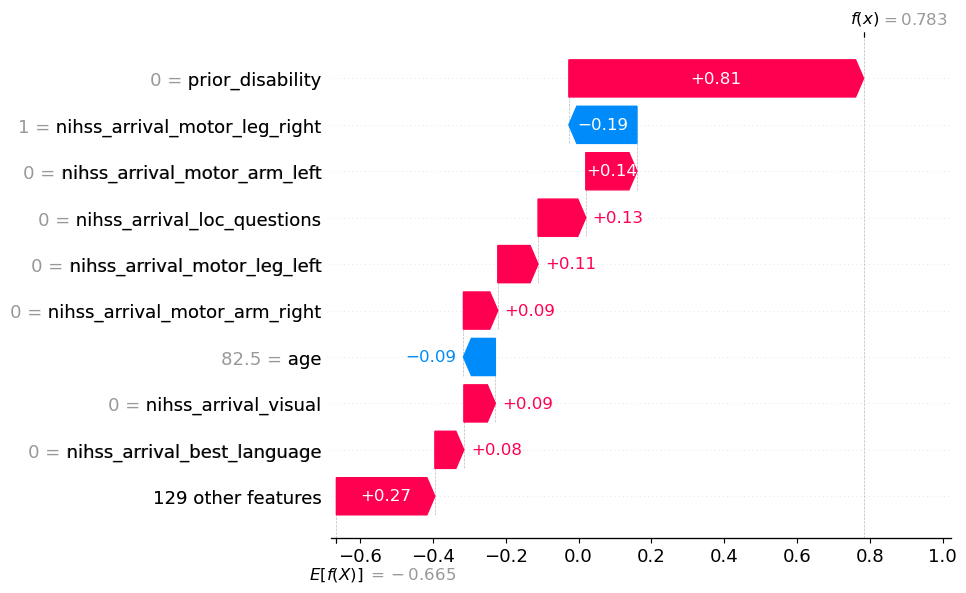

In [47]:
shap.waterfall_plot(shap.Explanation(values=shap_values[instance,:,c], 
                                     base_values=shap_values_extended.base_values[instance,c], 
                                     data=X_test.iloc[instance],  
                                     feature_names=X_test.columns.tolist()))

Let's view these plots for all of the outcome classes for a single instance.

Tried to create a function to create a set of force plots - subplots do not appear to be possible with force plots. Instead create and show each individual force plot.

In [48]:
def create_forceplot_multiclass_grid(
                row, n_classes, k, y_data_row, shap_values_list_row,
                list_base_values, X_data_row, feature_names, pred_mrs_row):
    """
    Each figure showing the relationship between each combination of features 
    on the SHAP value.
    Subplots do not seem to be possible with force plots.

    Args:
        row [integer]: the instance
        n_classes [list]: Class names
        k [integer]: kfold
        y_data_row [string]: the observed class
        shap_values_list_row [list]: shap values
        list_base_values [list]: base values
        X_data_row [series]: feature values for instance
        feature_names [list]: feature names
        pred_mrs_row [string]: the predicted class

    Return:
        None
    """

    # Each figure showing the relationship between
    # each combination of features on the SHAP value.
    # Subplots do not seem to be possible with force plots.

    for c in range(n_classes):
        shap.plots.force(list_base_values[c],
                        shap_values=shap_values_list_row[c],
                        features=X_data_row,
                        feature_names=feature_names, 
                        matplotlib=True,
                        show=False)#,

        title = (f"Predicting discharge mRS {c}.\n\nForce plot for instance "
                 f"{row}, for k-fold {k} (observed discharge mRS: {y_data_row},"
                 f" predicted discharge mRS: {pred_mrs_row}.\n")

        plt.title(title, y=1.75, pad=-50)
        
        plt.gcf().set_size_inches(20,6)
        plt.tight_layout()
        filename = os.path.join(paths.image_save_path, 
                        (paths.notebook + paths.model_text + 
                         f'_forceplot_for_class_{c}.jpg'))
        plt.savefig(filename, dpi=300)

        plt.show()

    return()

View force plots for all classes for a single instance (for a single k-fold). The class with the highest probability, is the resulting classification for this instance from the model.

(Can not look at a specific instance across the kfolds, as an instance is only in the test set for one kfold).

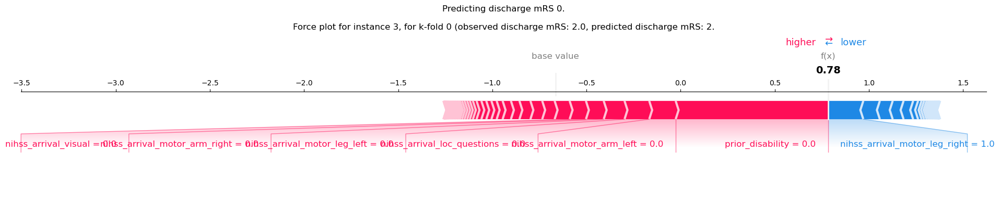

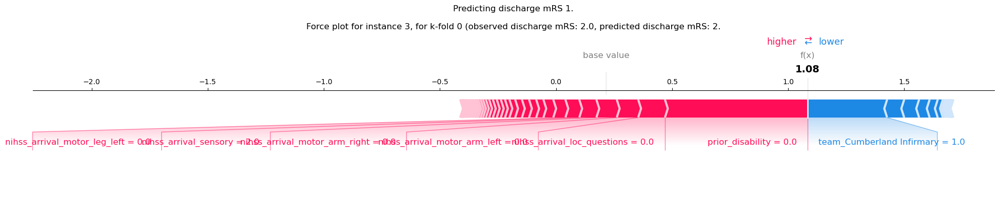

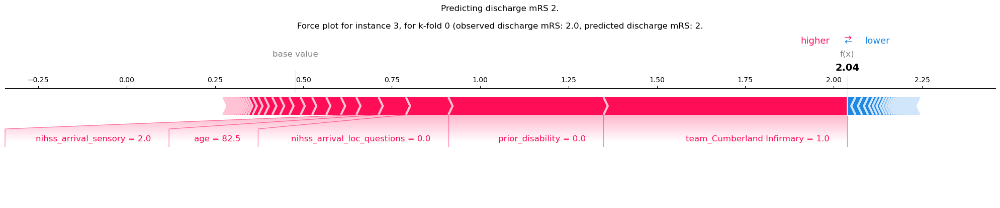

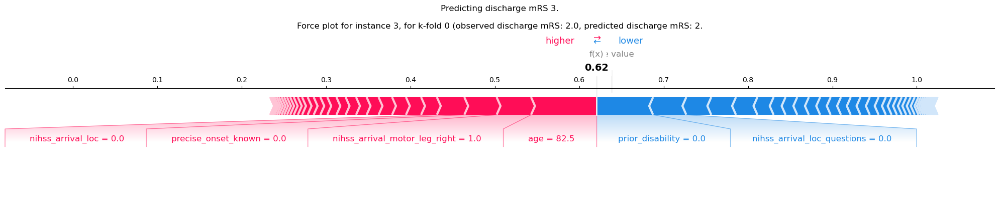

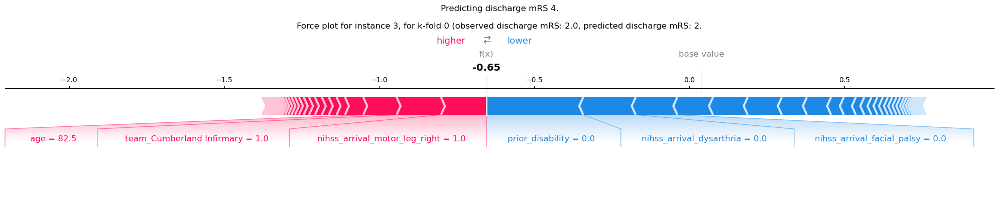

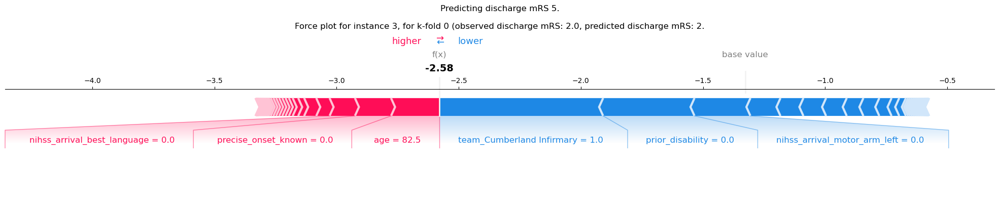

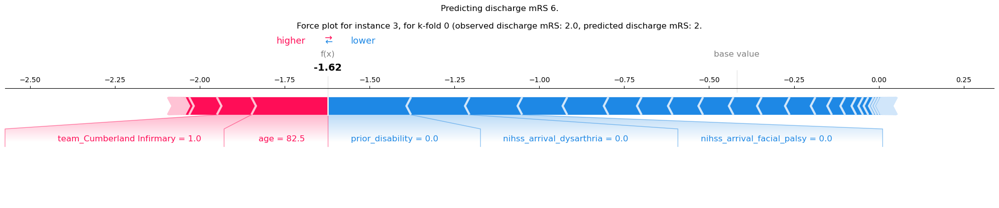

()

In [49]:
# Initialise empty list
list_shap_values = []
list_base_values = []

# Putting the SHAP values in the required format
for c in range(n_classes):
    list_shap_values.append(shap_values[instance,:,c])
    list_base_values.append(shap_values_extended.base_values[instance,c])

# Call funciton to create subplots
create_forceplot_multiclass_grid(instance, n_classes, k,
                                 y_test.iloc[instance], 
                                 list_shap_values,
                                 list_base_values, 
                                 X_test.iloc[instance], 
                                 feature_names_ohe, y_pred[instance])

Function to create a set of waterfall plots

In [50]:
def create_waterfall_multiclass_grid(
                row, n_classes, k, y_data_row, shap_values_list_row,
                list_base_values, X_data_row, feature_names, pred_mrs_row):
    """
    Create a matrix of subplots per class. Each showing the relationship between
    each combination of features on the SHAP value.
    Setup matrix of subplots
    
    Args:
        row [integer]: the instance
        n_classes [list]: Class names
        k [integer]: kfold
        y_data_row [string]: the observed class
        shap_values_list_row [list]: shap values
        list_base_values [list]: base values
        X_data_row [series]: feature values for instance
        feature_names [list]: feature names
        pred_mrs_row [string]: the predicted class

    Return:
        None
    """
    # Create a matrix of subplots per class. Each showing the relationship 
    # between each combination of features on the SHAP value.
    # setup matrix of subplots
    fig = plt.figure()

    # Set overall title
    fig.suptitle(f'Waterfall for instance {row}.\n'
                 f'Observed discharge mRS: {y_data_row}, '
                 f'predicted discharge mRS: {pred_mrs_row}.\n'
                 f'(a subplot for each mRS class, for k-fold {k})',
                fontsize=20)

    for c in range(n_classes):
        ax = fig.add_subplot(4,2,c+1)
        shap.waterfall_plot(shap.Explanation(values=shap_values_list_row[c], 
                                            base_values=list_base_values[c], 
                                            data=X_data_row,  
                                            feature_names=feature_names), 
                                            show=False)
        ax.set_title(f"Predicting discharge mRS {c}")
        
    plt.gcf().set_size_inches(20,15)
    plt.tight_layout()

    filename = os.path.join(paths.image_save_path, 
                        (paths.notebook + paths.model_text + 
                         '_waterfall_for_each_class.jpg'))
    plt.savefig(filename, dpi=300)

    plt.show()

    return()

View waterfall plots for all classes for a single instance (for a single k-fold). The class with the highest probability, is the resulting classification for this instance from the model.

(Can not look at a specific instance across the kfolds, as an instance is only in the test set for one kfold).

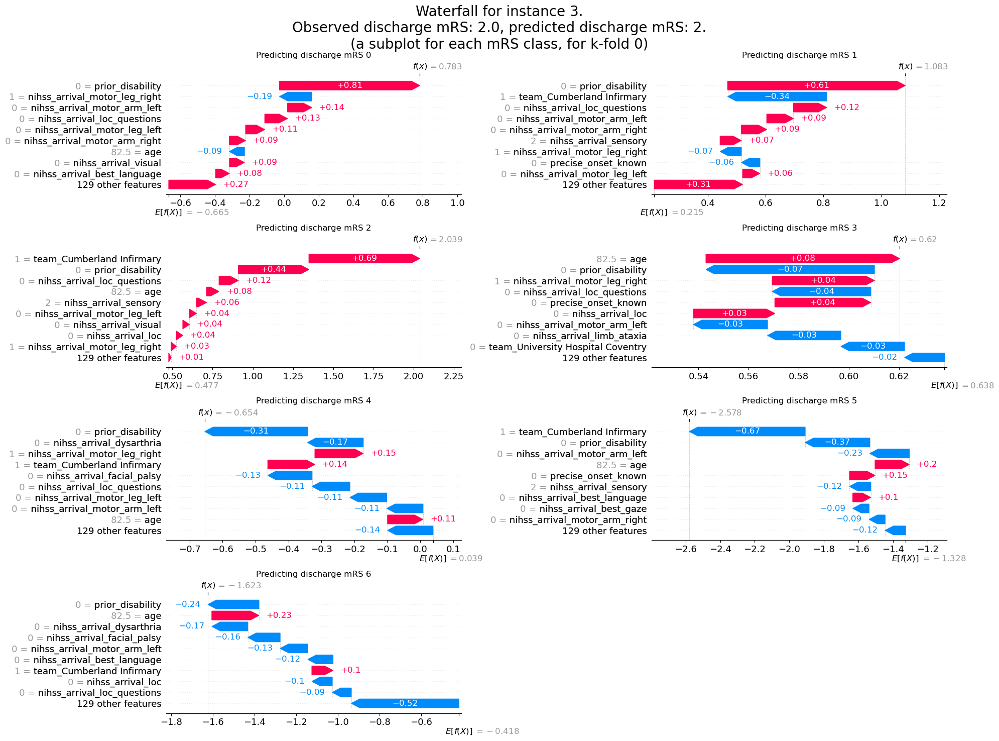

()

In [51]:
# Initialise empty list
list_shap_values = []
list_base_values = []

# Putting the SHAP values in the required format
for c in range(n_classes):
    list_shap_values.append(shap_values[instance,:,c])
    list_base_values.append(shap_values_extended.base_values[instance,c])

# Call funciton to create subplots
create_waterfall_multiclass_grid(instance, n_classes, k,
                                 y_test.iloc[instance], 
                                 list_shap_values,
                                 list_base_values, X_test.iloc[instance], 
                                 feature_names_ohe, y_pred[instance])

A SHAP value is returned for each feature, for each instance, for each of the 7 output classes. It represents the contribution on the models prediction.

We will use the shap library: https://shap.readthedocs.io/en/latest/index.html

'Raw' SHAP values from XGBoost model are log odds ratios. A SHAP value is returned for each feature, for each instance, for each model (one per k-fold)

In notebook 041 we looked at two versions of the summary SHAP plot for each kfold:

stacked bar (using shap.summary_plot() for all of the classes): One plot per kfold, the contribution (in terms of mean absolute SHAP) of a feature to each class output.
beeswarm (using shap.summary_plot() for a specific class): One plot per kfold and class, the contribution of a feature value to that class output.
Here we will delve a little deeper.

We've looked at the level of contribution each feature has on determining if a patient has a specific disability at discharge. Here we use dependence plots to look at patterns between the features (feature values and SHAP values) for each output class.

Each subplot contains a matrix of these features, showing the relationship between the SHAP value and feature value of one feature, while displaying the feature values of another feature. Each figure contains information for each output class - so we can observe how these patterns change depending on which output class are predicting.

We create a matrix of dependence plots (a plot per feature), and so we need to limit the number of features that we can include so that the visualisation is understandable.

We will include four features (informed by the importance results above): prior disability, age, stroke severity and onset to thrombolysis time.

This is to show an example of the type of visualisation that we can use to understand patterns that the model has identified. This is for the first kfold.

Resources used:

reduce the dot size/transparancy to reveal dense vs sparse areas https://slundberg.github.io/shap/notebooks/plots/dependence_plot.html Option to pass the argument "dot_size".

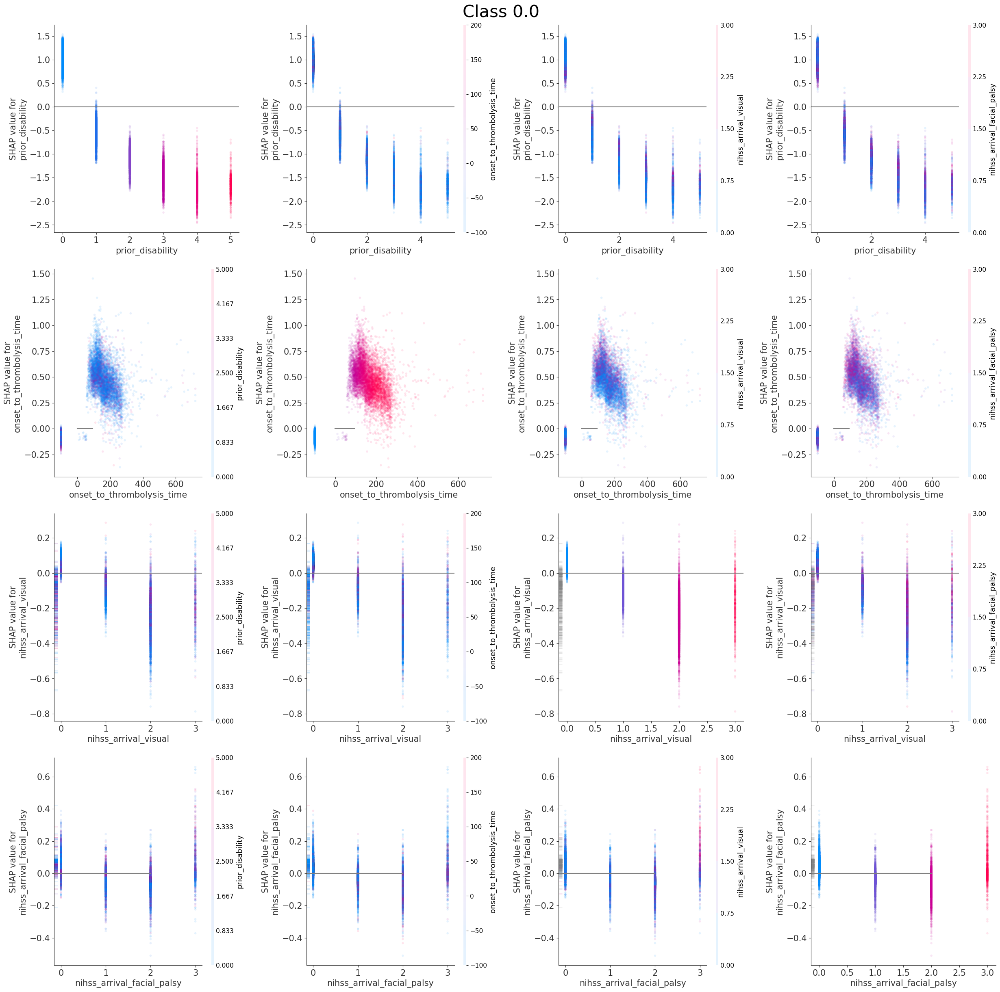

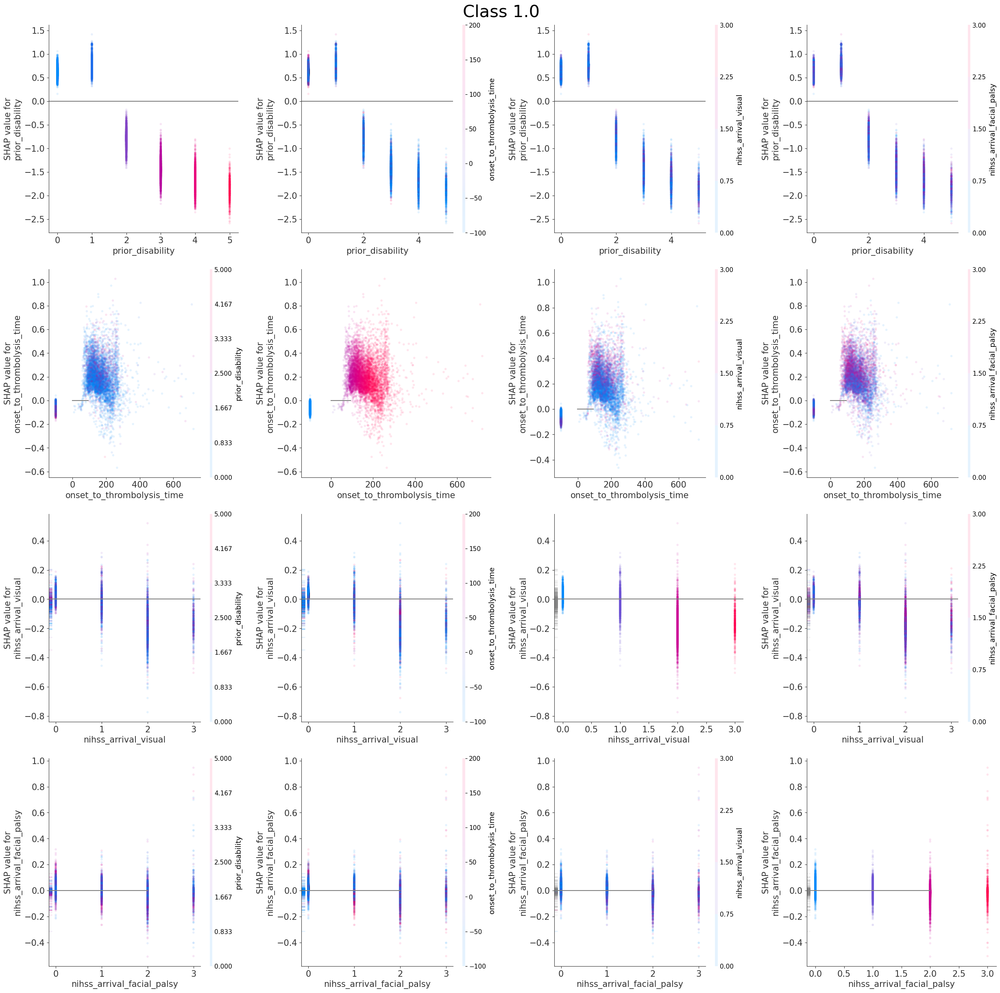

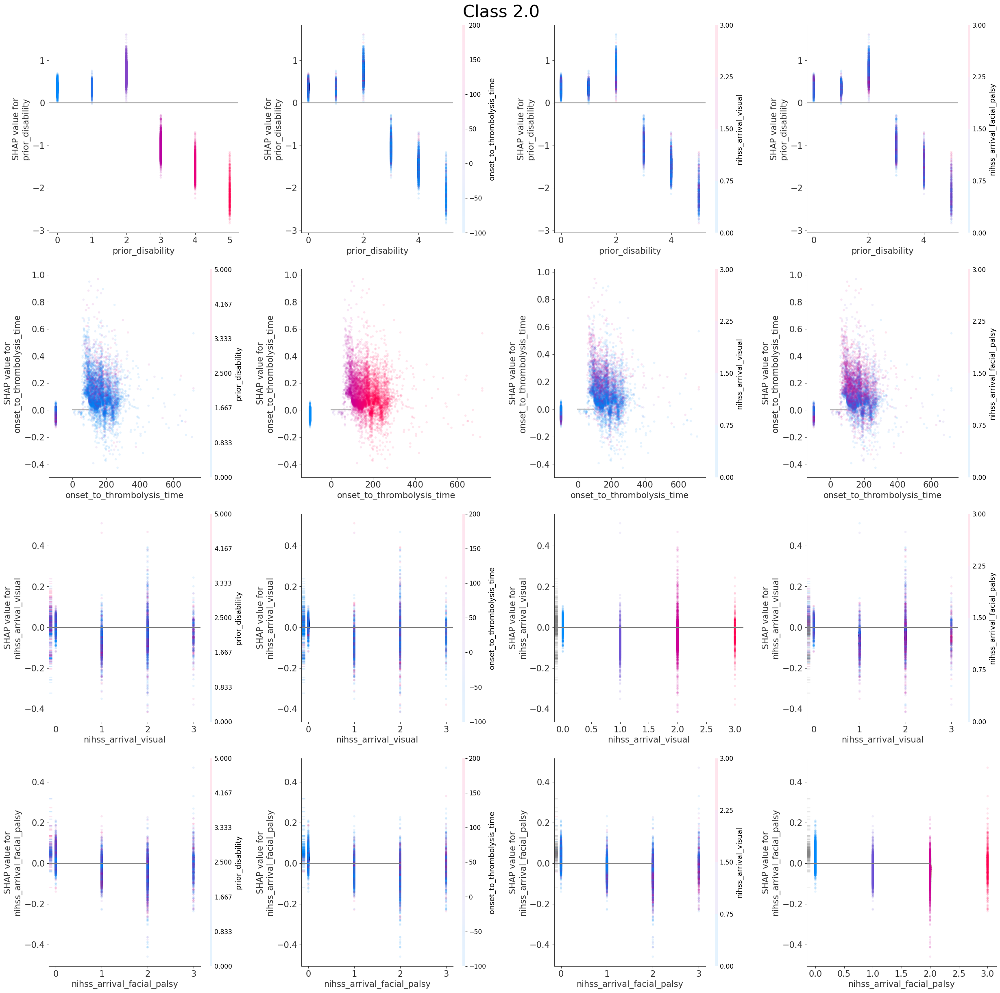

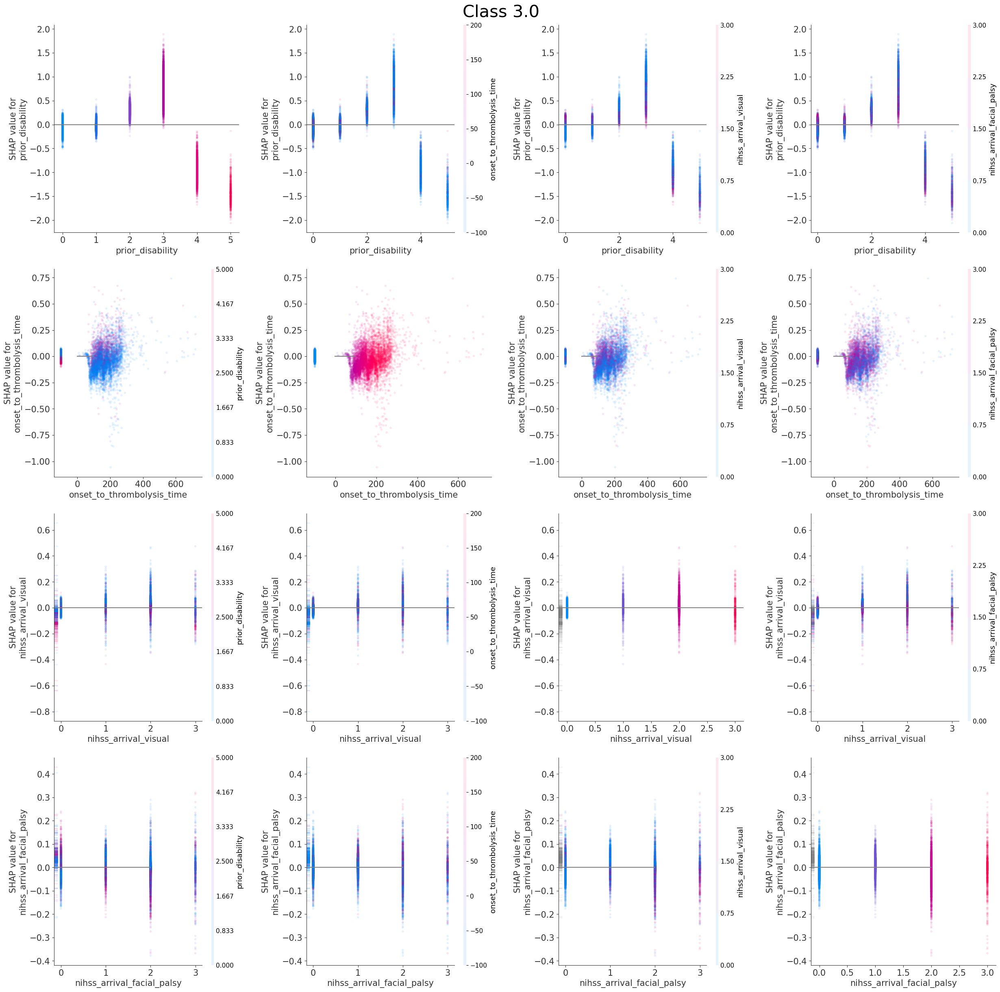

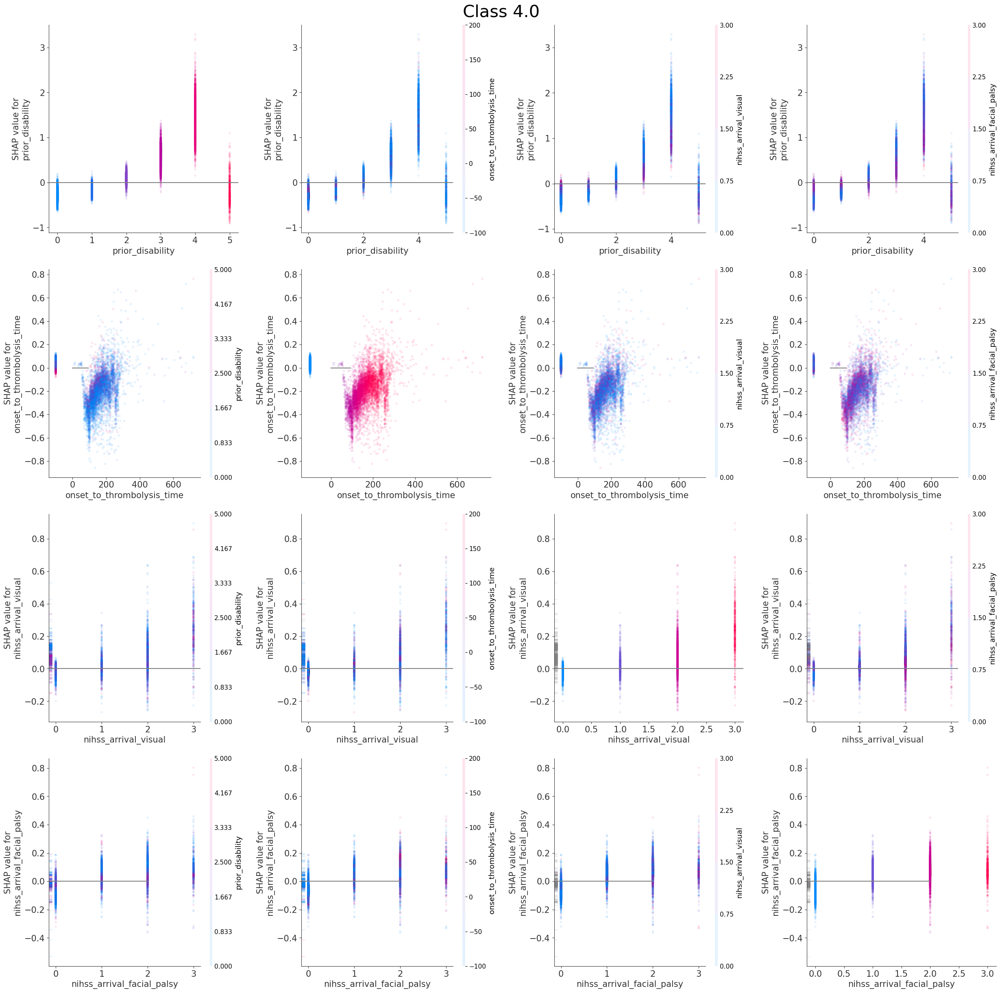

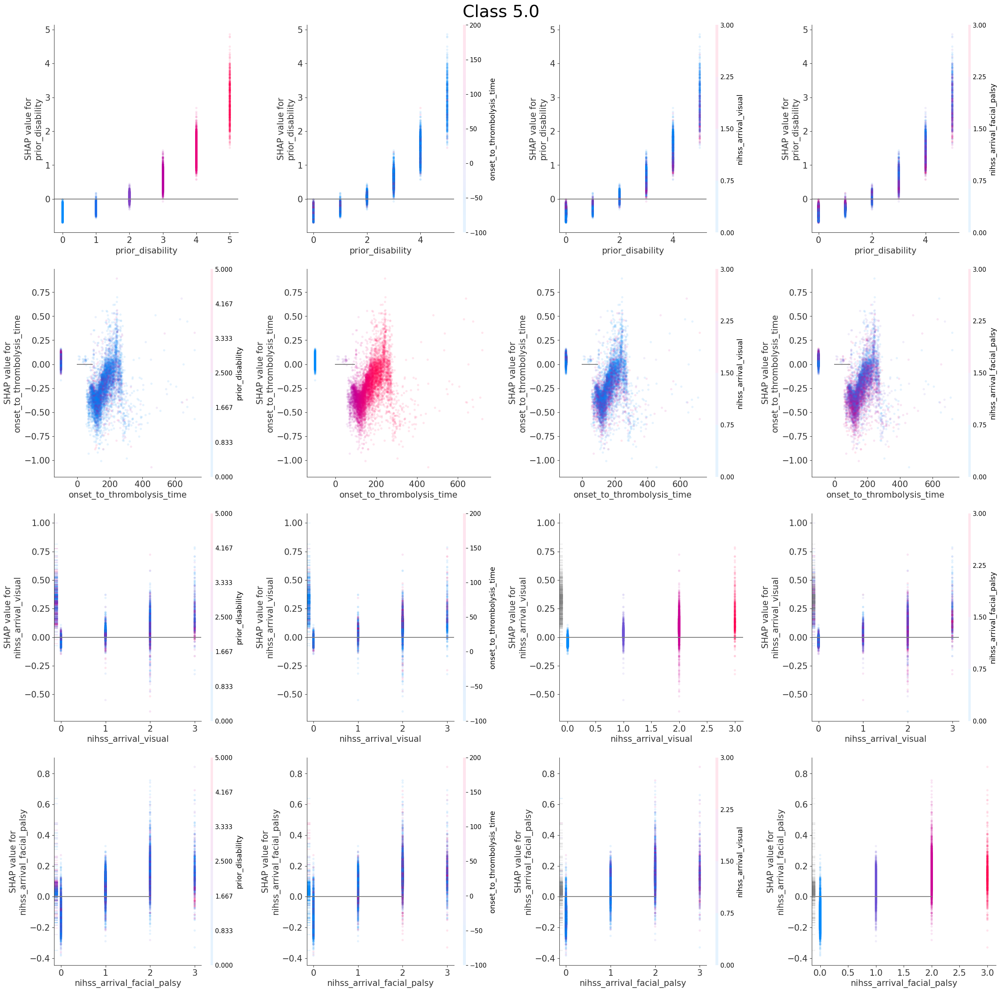

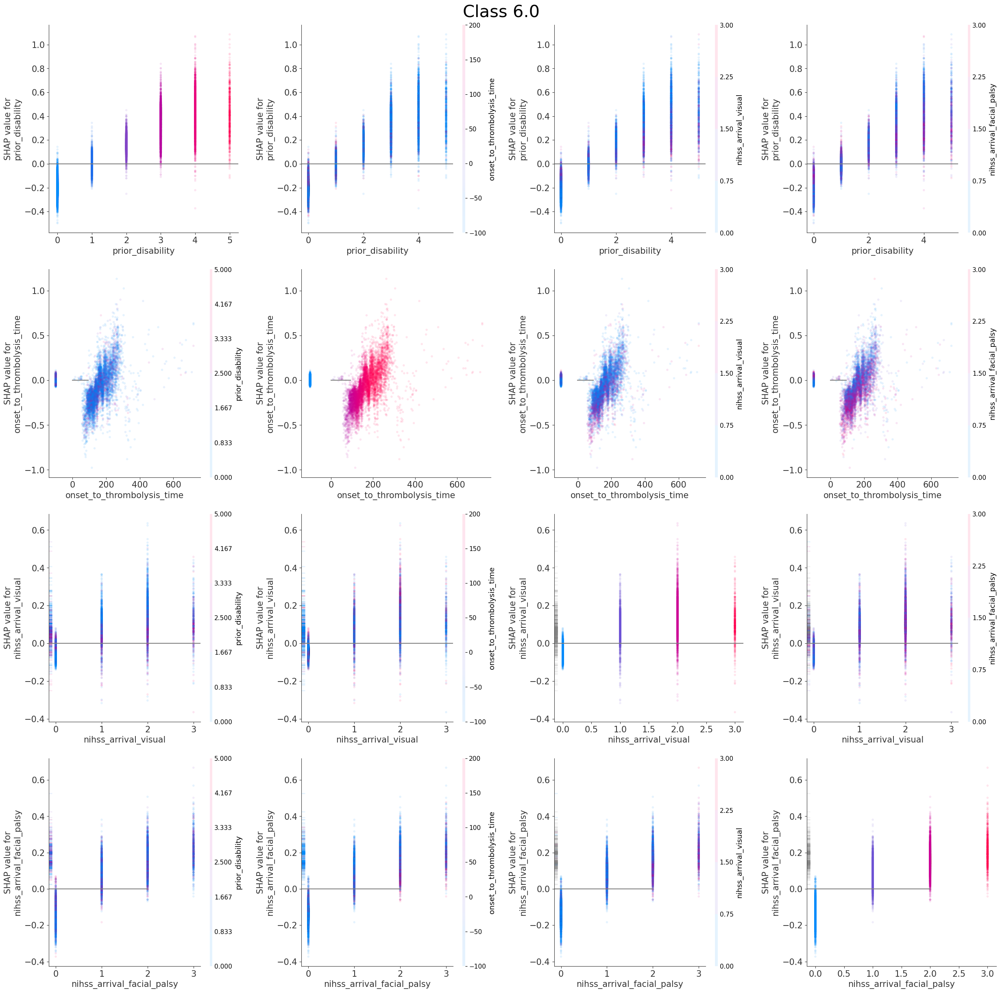

In [52]:
features_to_show = ["prior_disability", "onset_to_thrombolysis_time", 
                    "nihss_arrival_visual", "nihss_arrival_facial_palsy"]

n_features_show = len(features_to_show)

# Create a matrix of subplots per class. Each showing the relationship between
# each combination of features on the SHAP value.
for c in range(n_classes):

    # setup matrix of subplots
    fig, axes = plt.subplots(nrows=n_features_show,
                             ncols=n_features_show)
    axes = axes.ravel()

    # Set overall title
    fig.suptitle(f'Class {model.classes_[c]}', fontsize=30)

    # Initialise subplot counter
    count = 0

    # Loop through the features to display
    for i in range(len(features_to_show)):
        # Loop through the features to display
        for j in range(len(features_to_show)):
            # Create the plot. Pass the axes
            shap.dependence_plot(ind=features_to_show[i], 
                                interaction_index=features_to_show[j], 
                                shap_values=shap_values[:,:,c], 
                                features=X_test.values, 
                                feature_names=X_test.columns,
                                show=False, ax=axes[count],
                                alpha=0.1)
            
            # Add line as shap=0
            axes[count].plot([-1, X_test[feature_names_ohe[i]].max()+1],
                             [0,0],c='0.5')
            
            # Increase subplot counter
            count+=1
    
    # Change font size for each subplot
    for ax in axes:
        ax.set_xlabel(ax.get_xlabel(), fontsize=15)
        ax.set_ylabel(ax.get_ylabel(), fontsize=15)
        ax.tick_params(axis='both',which='major',labelsize=15)

    # Visual properties of figure
    dimension = 5 * 5
    fig.set_figheight(dimension)
    fig.set_figwidth(dimension)
    fig.tight_layout(pad=2)
    plt.show()


We can also choose one of these feature combinations and focus on seeing how the patterns change across the classes (as to do this comparison from the above set of plots requires a lot of scrolling and memory of the patterns seen in the other classes)

Create a function to plot the dependence plot for a specific feature and interaction, showing a plot per class

In [53]:
def create_set_of_dependence_plot_across_class(feature_to_show, 
                                               interaction_feature, k, 
                                               features, feature_names, 
                                               n_classes, shap_values):
    """
    
    Args:
        feature_to_show [string]: Name of feature to show data in plot
        interaction_feature [string]: Name of feature to show colour in plot
        k [integer]: The kfold being used
        features [dataframe]: feature data values
        feature_names [list]: list of feature names
        n_classes [integer]: number of classes in the multiclass classification 
                            model
        shap_values [dataframe]: SHAP values for each feature for each instance


    Return:
        None
    """

    # setup matrix of subplots
    fig, axes = plt.subplots(nrows=1, ncols=n_classes, figsize=(25,4))
    axes = axes.ravel()

    fig.suptitle("Predicting patient has this disability level at discharge",
                 fontsize=14)
    
    # Initialise values to be overwritten when find smaller/larger values
    y_min = 999
    y_max = -999

    for c in range(n_classes):

        shap.dependence_plot(ind=feature_to_show, 
                            interaction_index=interaction_feature, 
                            shap_values=shap_values[:,:,c], 
                            features=features, 
                            feature_names=feature_names,
                            show=False, ax=axes[c],
                            alpha=0.1)

        # Change font size for each subplot
        axes[c].set_xlabel(axes[c].get_xlabel(), fontsize=10)
        axes[c].set_ylabel(axes[c].get_ylabel(), fontsize=10)
        axes[c].tick_params(axis='both',labelsize=10)
        axes[c].set_title(label=f"Output class mRS {c}", fontsize=11)
        axes[c].set_ylim()

        # Add line as shap=0
        axes[c].plot(axes[c].get_xlim(), [0,0], c='0.5')

        y_min = min(y_min, axes[c].get_ylim()[0])
        y_max = max(y_max, axes[c].get_ylim()[1])

    # Give all plots the same range for y axis
    for c in range(n_classes):
        axes[c].set_ylim([y_min, y_max])

    # Visual propoerties of figure
    fig.tight_layout(pad=2, rect=(0, 0, 1, 0.985))

    filename = os.path.join(paths.image_save_path, 
                            (paths.notebook + paths.model_text + 
                            f'_dependence_plot_{feature_to_show}_' +
                            f'{interaction_feature}_all_classes_kfold{k}' +
                            '.jpg'))
    
    plt.savefig(filename, dpi=300)

    plt.show()

    return()

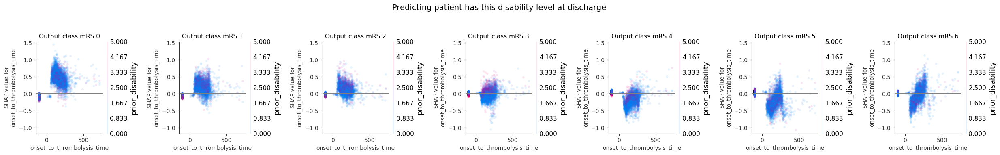

()

In [54]:
create_set_of_dependence_plot_across_class("onset_to_thrombolysis_time", 
                                           "prior_disability", 0, X_test.values, 
                                           X_test.columns, n_classes, 
                                           shap_values)

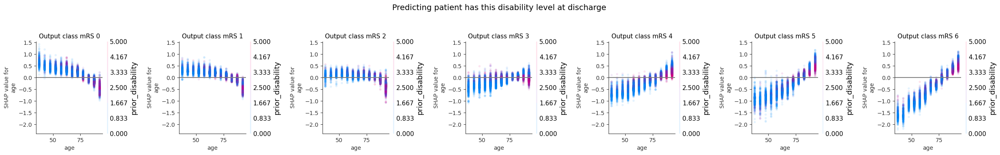

()

In [55]:
create_set_of_dependence_plot_across_class("age", 
                                           "prior_disability", 0, X_test.values, 
                                           X_test.columns, n_classes, 
                                           shap_values)

We can use violin plots to show the relationship between feature value and SHAP value for each of the features, for each target class.

We can also output descriptive text to use in documentations to describe the differences a feature value had on the likelihood of receiving thromboylsis.

Resource: https://towardsdatascience.com/binning-records-on-a-continuous-variable-with-pandas-cut-and-qcut-5d7c8e11d7b0 https://matplotlib.org/3.1.0/gallery/statistics/customized_violin.html

Create a function to style the axis

In [56]:
def set_ax(ax, category_list, feat, rotation=0):
    '''

    Args:
        ax [matplotlib axis object]: matplotlib axis object
        category_list [list]: used for the xtick labels (the grouping of the data)
        feat [string]: used in the axis label, the feature that is being plotted
        rotation [integer]: xtick label rotation

    Return
        ax [matplotlib axis object]:
    
    resource: 
    https://matplotlib.org/3.1.0/gallery/statistics/customized_violin.html
    '''
    # Set the axes ranges and axes labels
    ax.get_xaxis().set_tick_params(direction='out')
    ax.xaxis.set_ticks_position('bottom')
    ax.set_xticks(np.arange(1, len(category_list) + 1))
    ax.set_xticklabels(category_list, rotation=rotation, fontsize=7)
    ax.set_xlim(0.25, len(category_list) + 0.75)
    ax.set_ylabel(f'SHAP values for {feat}', fontsize=12)
    ax.set_xlabel(f'Feature values for {feat}', fontsize=12)
    return(ax)

Create a function to create a grid of violin plots

In [57]:
def create_grid_of_violin_plots(features_violin, 
                                class_category,
                                shap_values_extended
                                ):
    """
    Create a grid of violin plots (with each violin plot showing the 
    relationship between feature value and its SHAP value.

    Depending on the feature, there are some special cases for the plot layout.
   
    Args:
        features_violin [list]: list of features to create a violin plot
        class_category [integer]: the class to show
        shap_values_extended [shap_values variable]: shap values for a kfold
                (with three attributes: .values, .base_values and .data)
        
    Return:
        None
    
    """
    # Feature Age needs special consideration. It needs the x ticks to be created,
    # as the other features with over 50 unique values, but age is already grouped 
    # for the model (into 5yr groups) and so is treated as the other type.

    # Create figure
    fig = plt.figure(figsize=(12,14), constrained_layout=True)


    fig.suptitle(f'Model to predict discharge disability mRS = {class_category}', 
                 fontsize=20)

    # A subplot showing violin plot for each feature.
    # First prepare the fature data for the violin plot: if feature has more than 
    # 50 unique values then assume it needs to be binned (a violin for each bin)

    # Determine number of rows of subplots by rounding up
    ncols = 2
    nrows = math.ceil(len(features_violin)/ncols)

    # Through each feature
    for n, feat in enumerate(features_violin):    
        
        # Get data and SHAP values
        feature_data = shap_values_extended[:, feat, class_category].data
        feature_shap = shap_values_extended[:, feat, class_category].values

        # If feature has more that 50 unique values, then assume it needs to be 
        # binned (otherwise assume they are unique categories)

        if np.unique(feature_data).shape[0] > 50:
            # bin the data, create a violin per bin
            
            # settings for the plot
            rotation = 45
            step = 30
            n_bins = min(11, np.int((feature_data.max())/step))
            
            # create list of bin values
            bin_list = [(i*step) for i in range(n_bins)]
            bin_list.append(feature_data.max())
            if feat == "onset_to_thrombolysis_time":
                # for -100 for no IVT
                bin_list.insert(0, feature_data.min())

            # Number of instances per bin
            counts, edges = np.histogram(feature_data, bins=bin_list, density=False)

            # create list of bins (the unique categories)
            category_list = [f'{i*step}-{((i+1)*step-1)}\n[n={int(counts[i+1])}]' for i in range(n_bins-1)]
            category_list.append(f'{(n_bins-1)*step}+\n[n={int(counts[-1])}]')
            if feat == "onset_to_thrombolysis_time":
                # for -100 for no IVT
                category_list.insert(0, f'Not receive IVT\n[n={int(counts[0])}]')

            # bin the feature data
            feature_data = pd.cut(feature_data, bin_list, labels=category_list, 
                                right=False)

            # create a list, each entry contains the corresponsing SHAP value for that 
            # category (or bin). A violin will represent each list.    
            shap_per_category = []
            for category in category_list:
                mask = feature_data == category
                shap_per_category.append(feature_shap[mask])

        else:
            # create a violin per unique value
            
            # settings for the plot
            rotation = 90
            
            # create list of unique categories in the feature data
            category_list = np.unique(feature_data)

            if 'nihss' in feat:
                cl = category_list
                category_list = [e for e in cl if not math.isnan(e)]

            # Age needs to keep its decimal value (midpoint between 5 yrs)
            if feat != 'age':
                category_list = [int(i) for i in category_list]

            # create a list, each entry contains the corresponsing SHAP value for that 
            # category (or bin). A violin will represent each list.    
            count = []
            shap_per_category = []
            for category in category_list:
                mask = feature_data == category
                shap_per_category.append(feature_shap[mask])
                count.append(mask.sum())

            if feat == 'age':
                # create text of x ticks
                category_list = [f'{int(i-2.5)}-{int(i+2.5)}' for i in category_list]

                # SSNAP dataset had oldest age category as 100-120 (not a 5 yr band as 
                #   the other ages). To accommodate this, if last age category is "110"
                #   then overwrite the label with the correct band (100-120), and not
                #   107-112 as the above code would create.
                if category_list[-1] == '107-112':
                    category_list[-1] = '100-120'
            if feat == 'stroke_severity':
                # not enough space of chart for 2 lines fo x tick labels
                category_list = [f'{category_list[i]} [n={count[i]}]' for i in range(len(category_list))]
            else:
                category_list = [f'{category_list[i]}\n[n={count[i]}]' for i in range(len(category_list))]

        # create violin plot
        ax = fig.add_subplot(nrows,ncols,n+1)

        ax.violinplot(shap_per_category, showmeans=True, widths=0.9, 
                      showextrema=False)

        # Add line at Shap = 0
        plt.axhline(y=0, c='0.5')

        # customise the axes
        ax = set_ax(ax, category_list, feat, rotation=rotation)
        plt.subplots_adjust(bottom=0.15, wspace=0.05)

        # Adjust stroke severity tickmarks
        if feat == 'Stroke severity':
            ax.set_xticks(np.arange(1, len(category_list)+1, 2))
            ax.set_xticklabels(category_list[0::2])   
            
        # Add title
        if 'nihss' in feat:
            # individual NIHSS features have some nan values. Report the number
            # that are not included in the plot
            n_nan = np.count_nonzero(np.isnan(feature_data))
            ax.set_title(f'{feat} (number of nans not shown: {n_nan})')
        else:
            ax.set_title(feat)
        
    plt.tight_layout(pad=2)
        
    filename = os.path.join(paths.image_save_path, (paths.notebook + 
                            paths.model_text + 
                            '_thrombolysis_shap_violin_all_' +
                            f'features_for_mRS{class_category}.jpg'))
    fig.savefig(filename, 
                dpi=300, bbox_inches='tight', pad_inches=0.2)

    plt.show()
    return()

Show violin plots for the first kfold

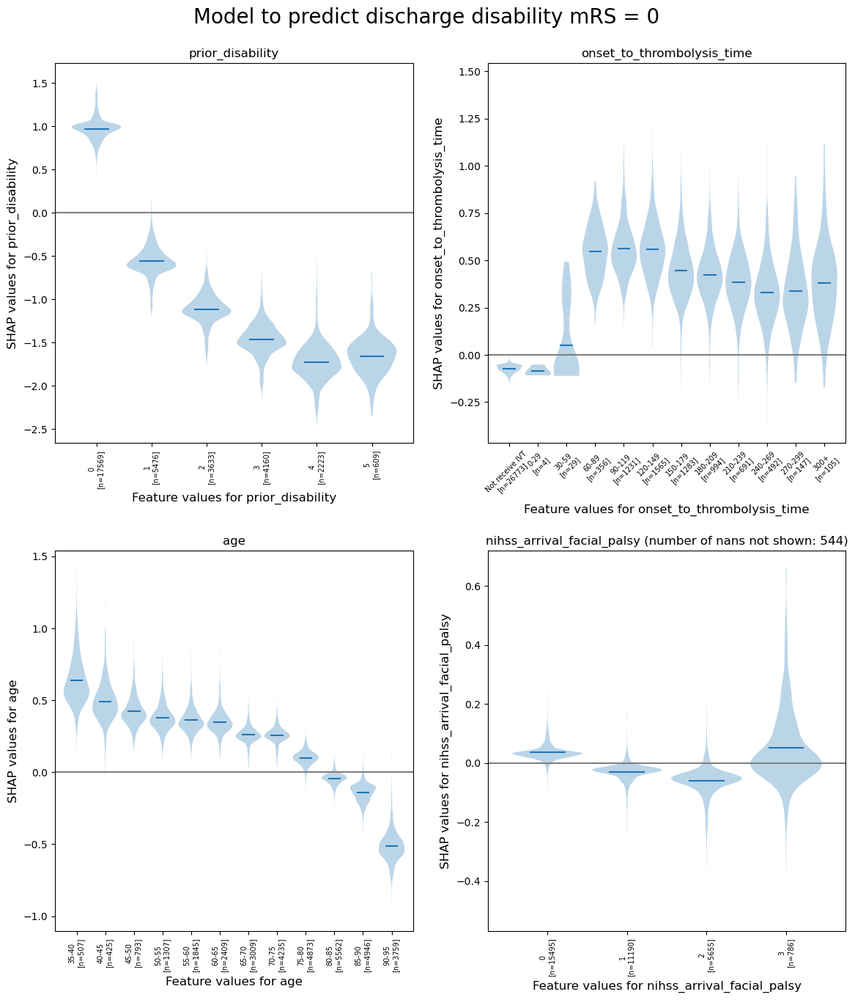

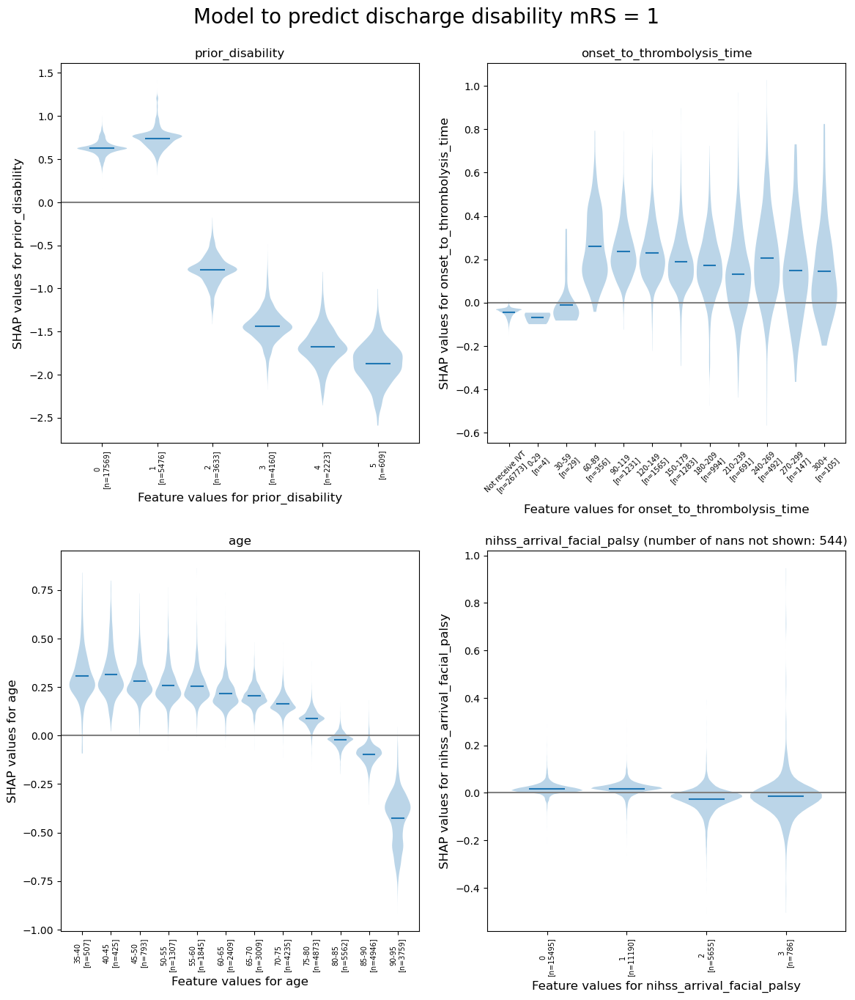

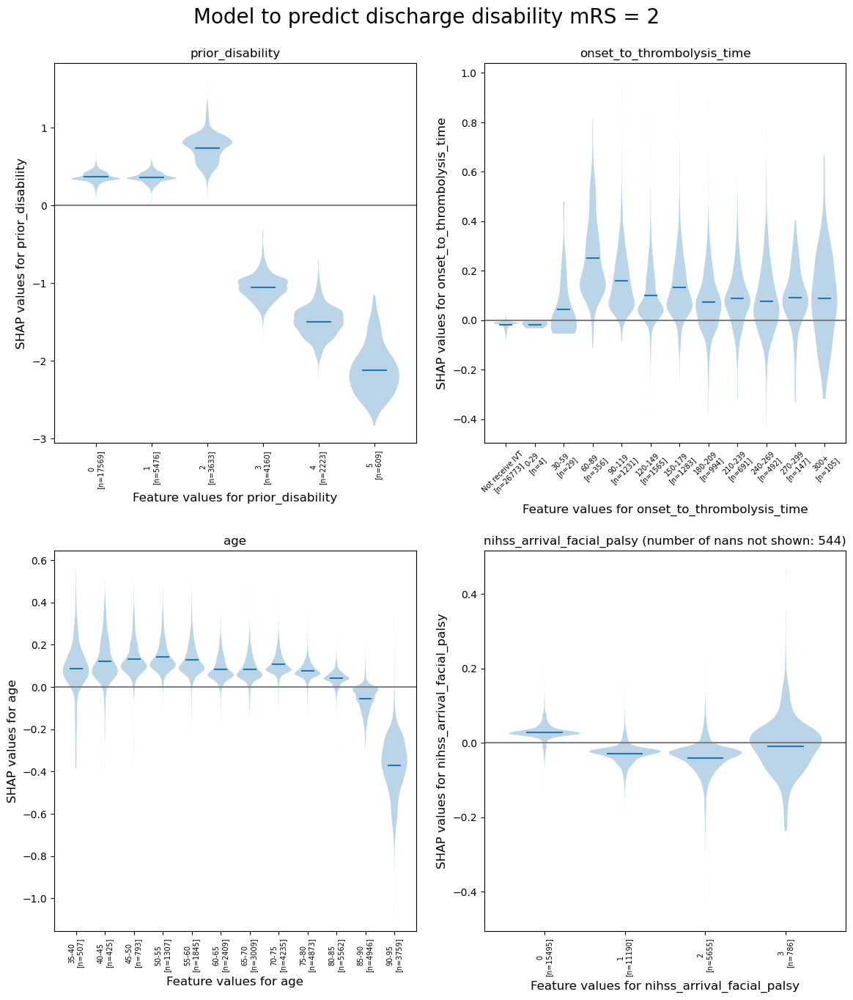

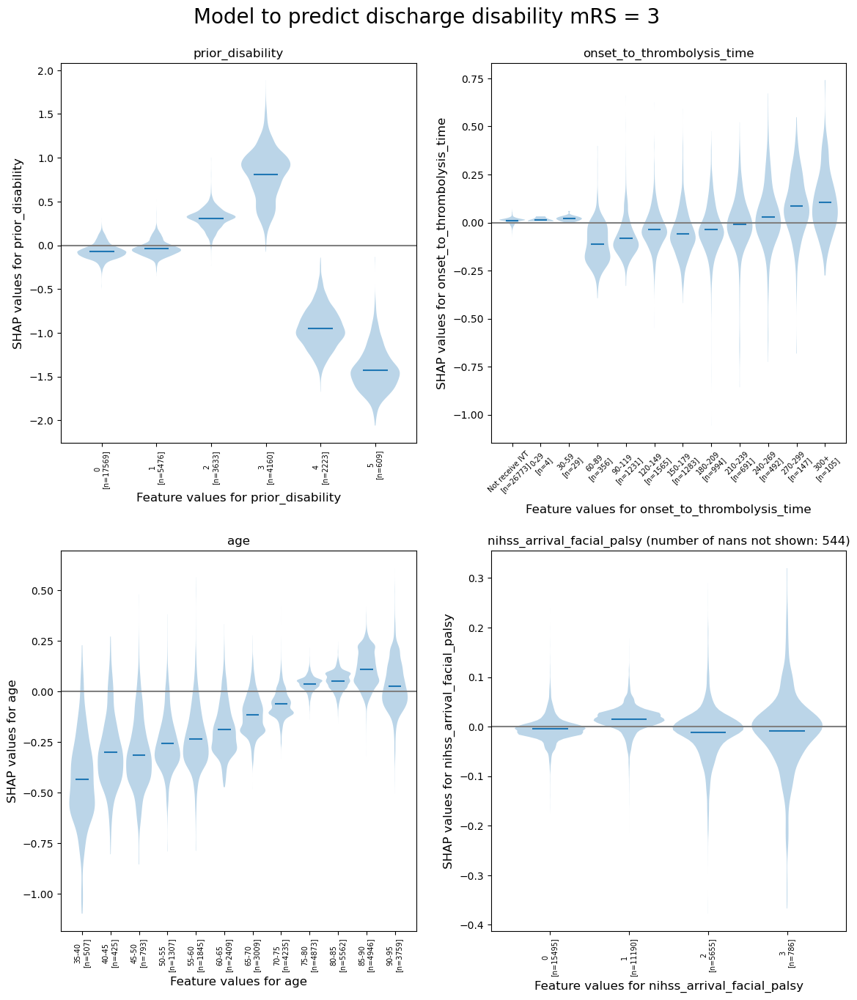

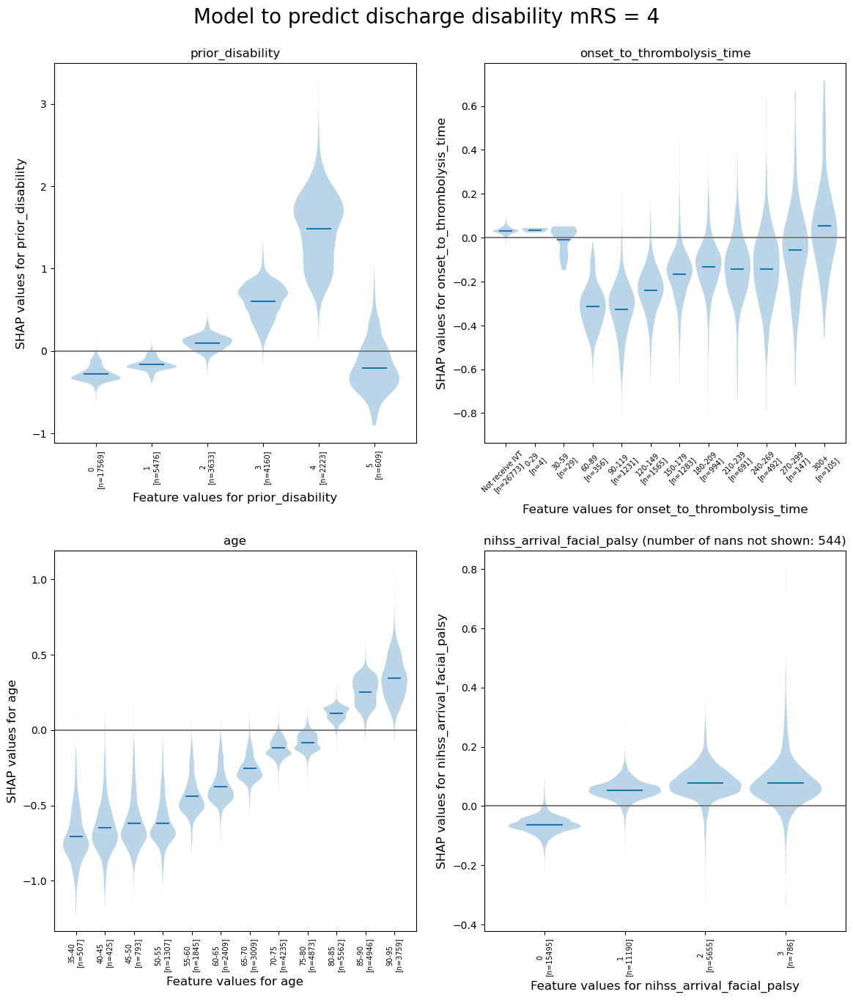

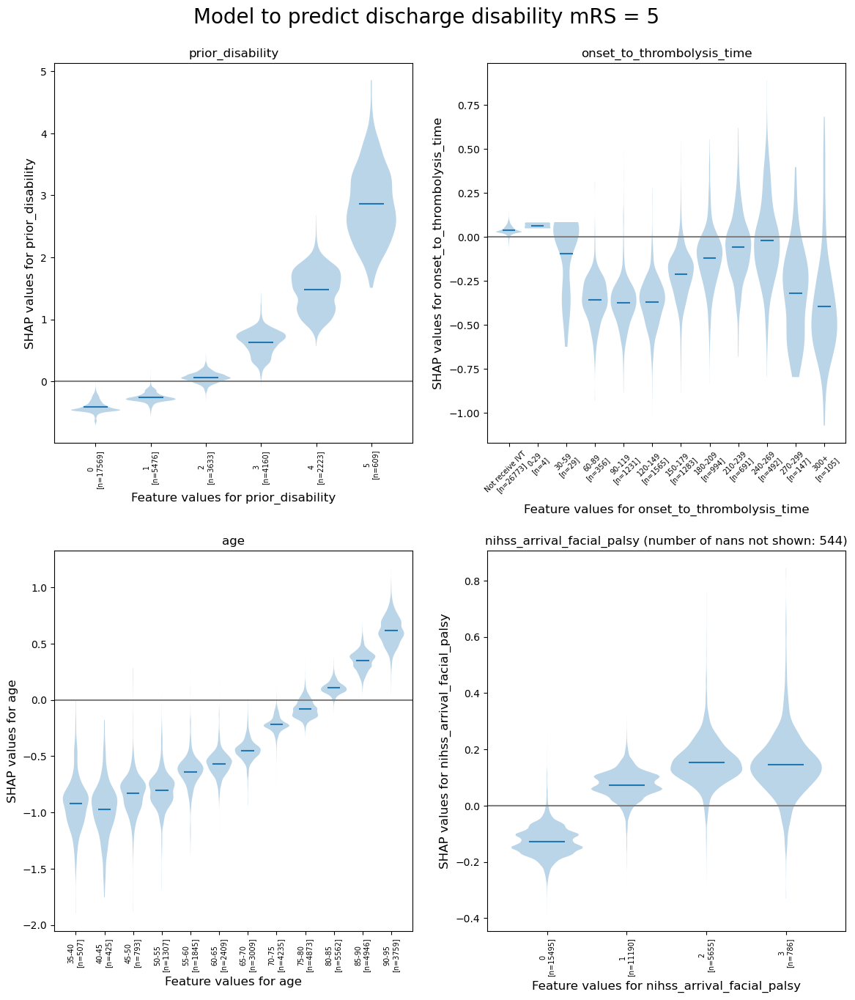

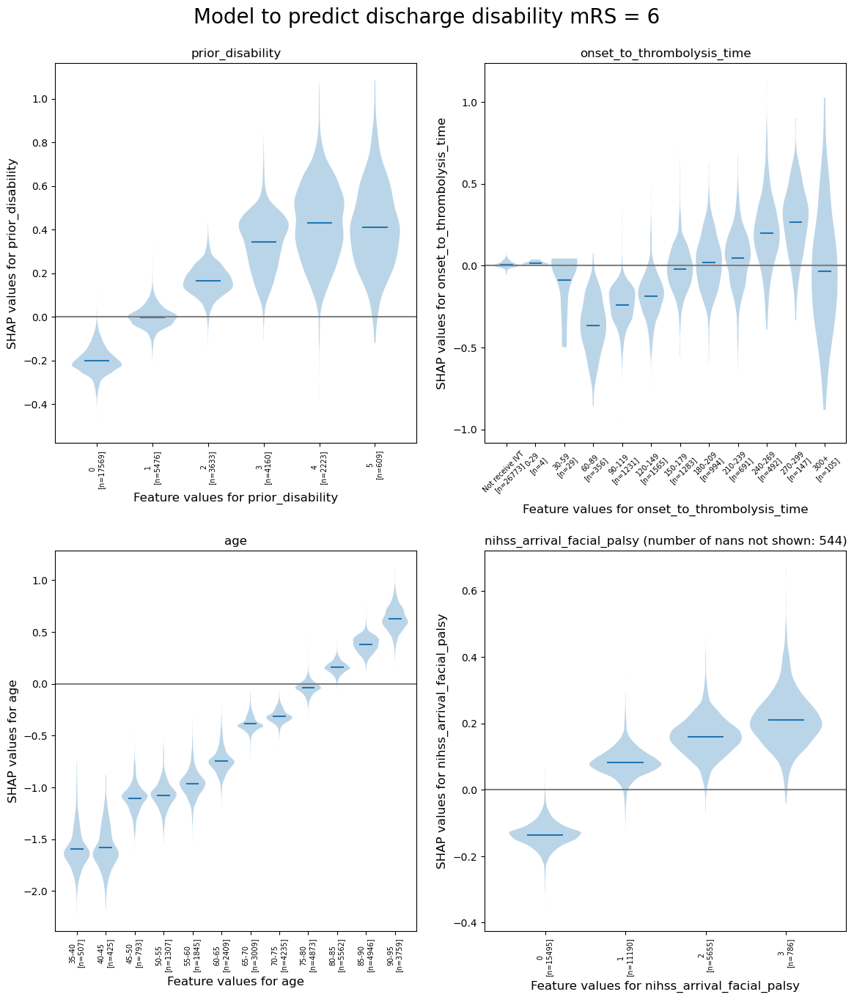

In [58]:
# Features to include in the violin plot grid
features_violin = ['prior_disability', 'onset_to_thrombolysis_time','age', 
                   'nihss_arrival_facial_palsy']

for c in range(n_classes):
    create_grid_of_violin_plots(features_violin, 
                                c,
                                shap_values_extended)

Compare SHAP values for the hospital one-hot encoded features.

The hospital feature is one-hot encoded, so there is a SHAP value per stroke team. We will use this to create a histogram of the frequency of the SHAP value for the hospital feature (take the mean of the SHAP values for the instances for each hospital's own patients).

In [59]:
def create_histogram_data_and_plot(test_stroke_team,
                                   shap_values,
                                   features_ohe,
                                   class_category):
    """
    
    
    
    Args:
        test_stroke_team []:
        shap_values []:
        features_ohe []:
        class_category []:

    Return:
        None
    """

    # Set up list for storing patient data and hospital SHAP
    feature_data_with_shap = []

    # Get mean SHAP for stroke team when patient attending that stroke team
    unique_stroketeams_list = list(np.unique(test_stroke_team))
    stroke_team_mean_shap = []
    stroke_team_std_shap = []
    # Loop through stroke teams
    for stroke_team in unique_stroketeams_list:
        # Identify rows in test data that match each stroke team
        mask = test_stroke_team == stroke_team
        # Extract those rows, for the class
        stroke_team_shap_all_features = shap_values[mask,:]#shap_values[mask]
        # Get column index for stroke_team_in_shap
        feature_name = 'team_' + stroke_team
        index = features_ohe.index(feature_name)
        # Get SHAP values for hospital
        stroke_team_shap = stroke_team_shap_all_features[:, index]
        # Get mean of the absolute SHAPs
        mean_shap = np.mean(np.absolute(stroke_team_shap))
        # Store mean
        stroke_team_mean_shap.append(mean_shap)
        # Get std
        std_shap = np.std(stroke_team_shap)
        # Store std
        stroke_team_std_shap.append(std_shap)

        # Get and store feature data and add SHAP
        feature_data = pd.DataFrame(data=test_stroke_team[mask].values, 
                                    columns=["Hospital_name"])
        feature_data['Hospital_SHAP'] = stroke_team_shap
        feature_data_with_shap.append(feature_data)

    # Concatenate and save feature_data_with_shap
    feature_data_with_shap = pd.concat(feature_data_with_shap, axis=0)

    filename = os.path.join(paths.data_save_path, (paths.notebook + 
                            paths.model_text + 
                            f'_individual_data_of_hospital_attended_shap_for_'
                            f'mRS{class_category}.csv'))
    feature_data_with_shap.to_csv(filename, index=False)

    # Create and save shap mean value per hospital
    hospital_data = pd.DataFrame()
    hospital_data["stroke_team"] = unique_stroketeams_list
    hospital_data["mean_abs_shap"] = stroke_team_mean_shap
    hospital_data["std_shap"] = stroke_team_std_shap
    filename = os.path.join(paths.data_save_path, (paths.notebook + 
                            paths.model_text + 
                            f'_meanabs_std_shap_per_hospital_for_mRS{class_category}'
                            f'.csv'))
    hospital_data.to_csv(filename, index=False)

    # Plot histogram of the frequency of the mean SHAP value for the instances for each hospital's own patients
    # Use from violin plots
    fig = plt.figure(figsize=(12,3))
    ax = fig.add_subplot()

    ax.hist(stroke_team_mean_shap, bins=np.arange(-1.5, 1.5, 0.1), 
            color=[0.12156863, 0.46666667, 0.70588235, 0.3], 
            ec=[0.12156863, 0.46666667, 0.70588235, 1.], 
            linewidth=1.4)
    ax.set_title(f"Outcome for class {class_category}")
    ax.set_xlabel('SHAP values (mean of the absolutes) for hospital attended')
    ax.set_ylabel('Count')
    filename = os.path.join(paths.image_save_path, (paths.notebook + 
                            paths.model_text + 
                            '_hosp_shap_hist.jpg'))
        
    plt.savefig(filename, dpi=300, 
                bbox_inches='tight', pad_inches=0.2)
    plt.show()

    return()

For the first kfold, produce the histograms of the frequency of the hospital one hot encoded shap value, the attended hospital - a plot per target class.

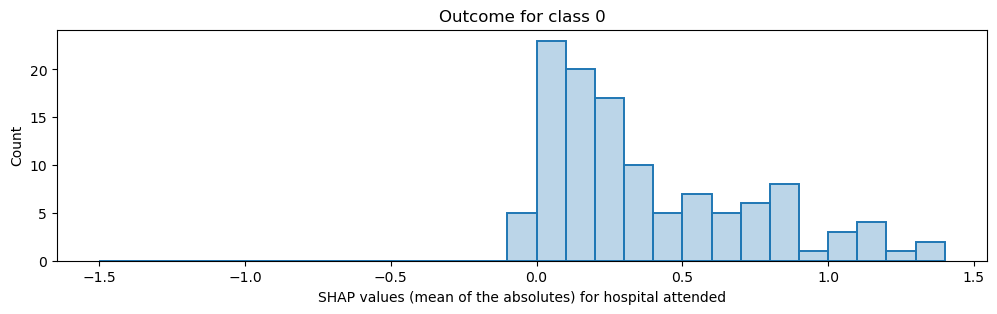

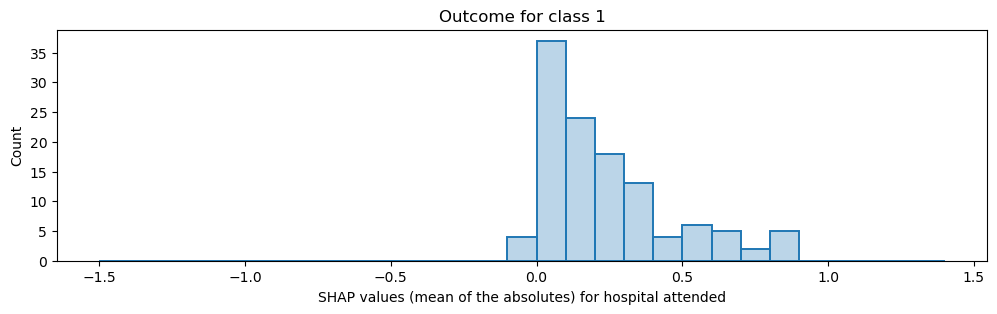

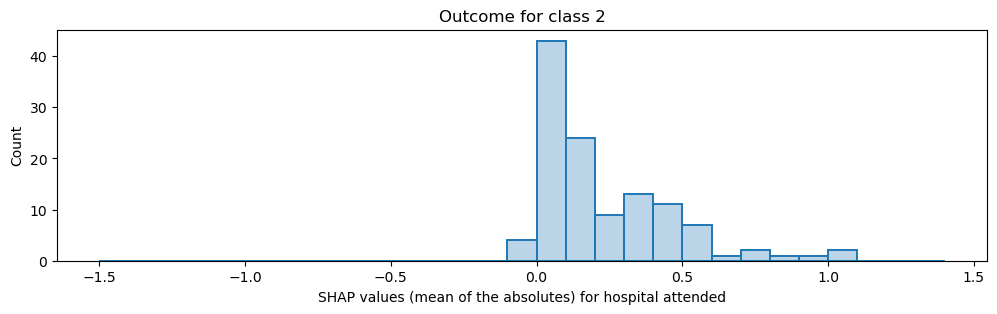

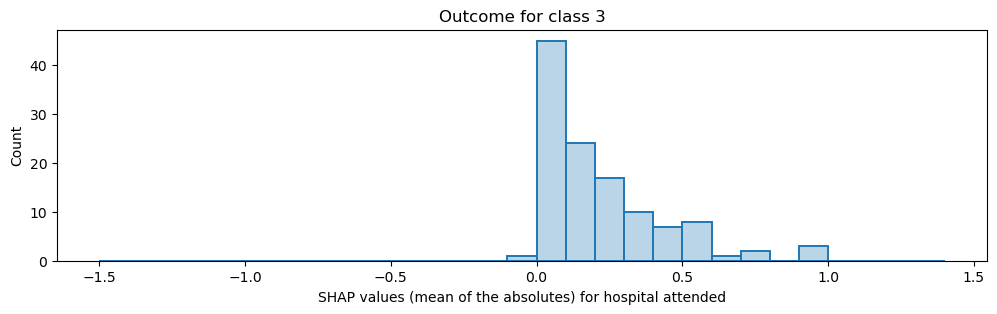

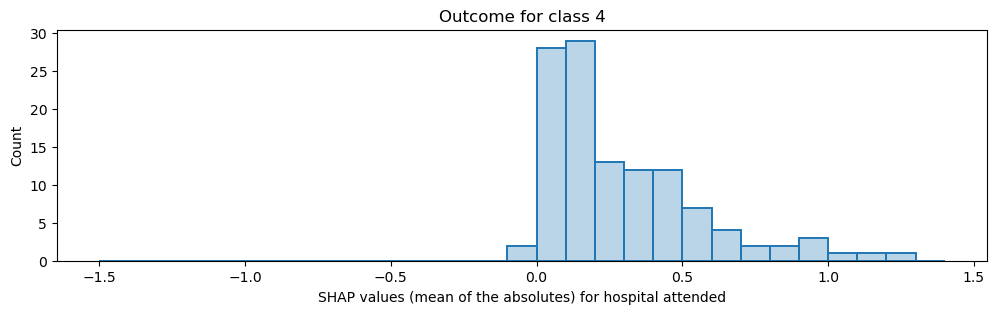

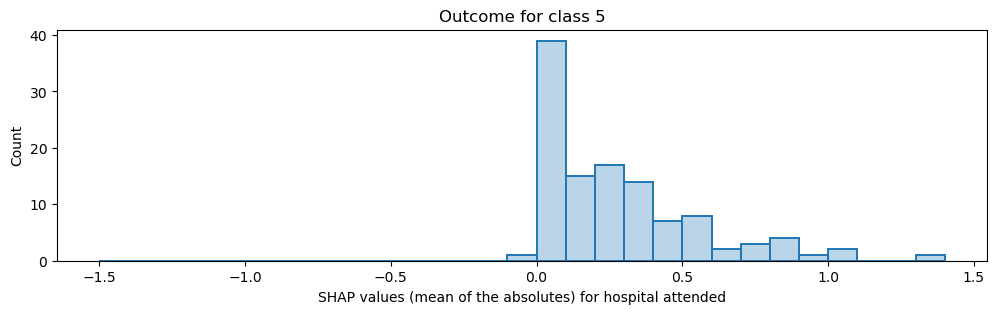

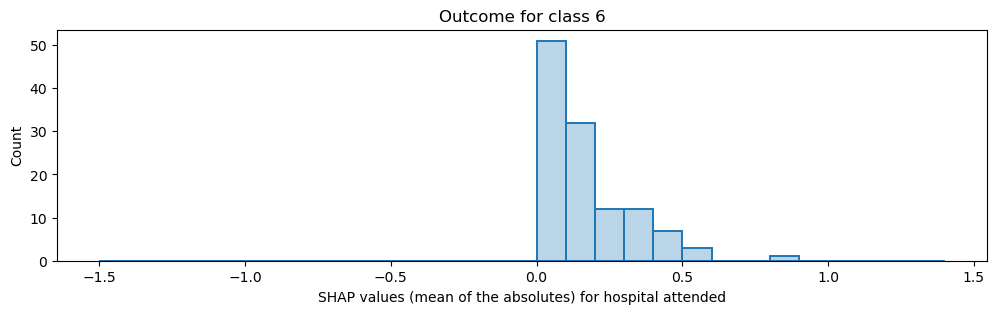

In [60]:
for c in range(n_classes):
    create_histogram_data_and_plot(test_stroke_team,
                                   shap_values[:,:,c],
                                   feature_names_ohe,
                                   c)

Show the relationship between feature value and SHAP value for all features that aren't an individual NIHSS score (as they contain nans), and apart from stroke team, as SHAP plots scatter. Show for each class.

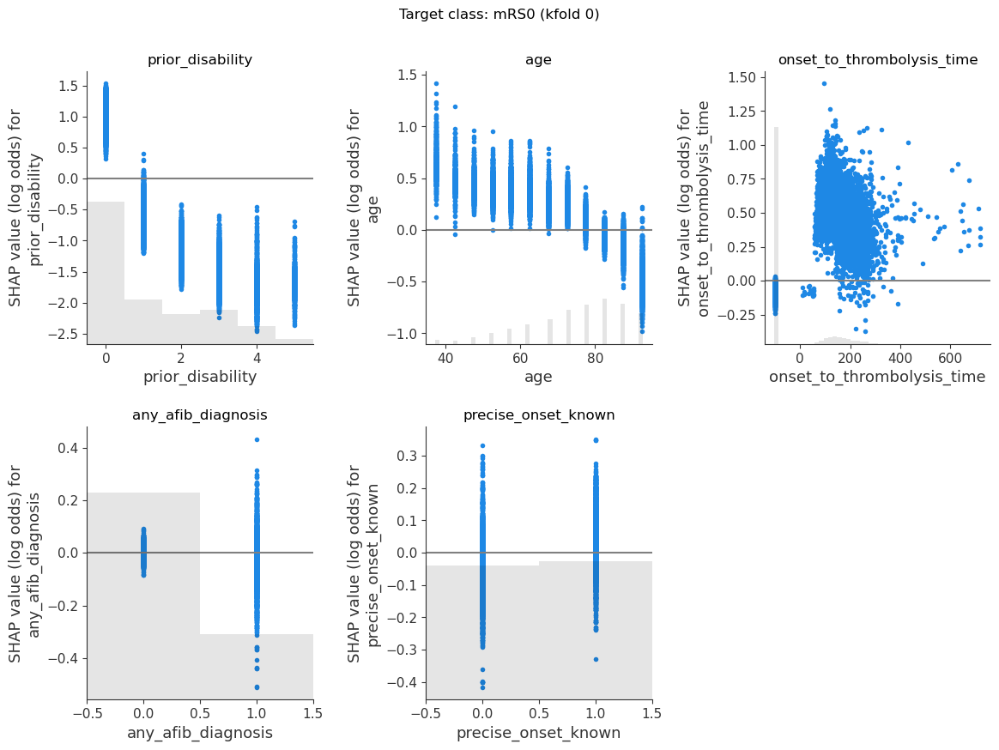

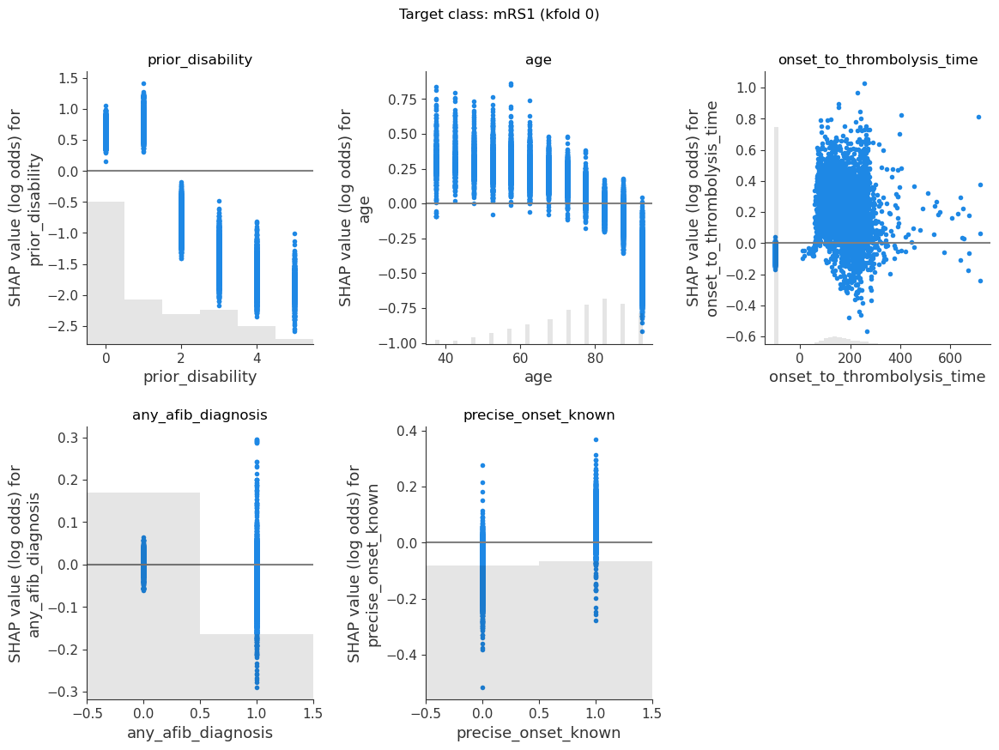

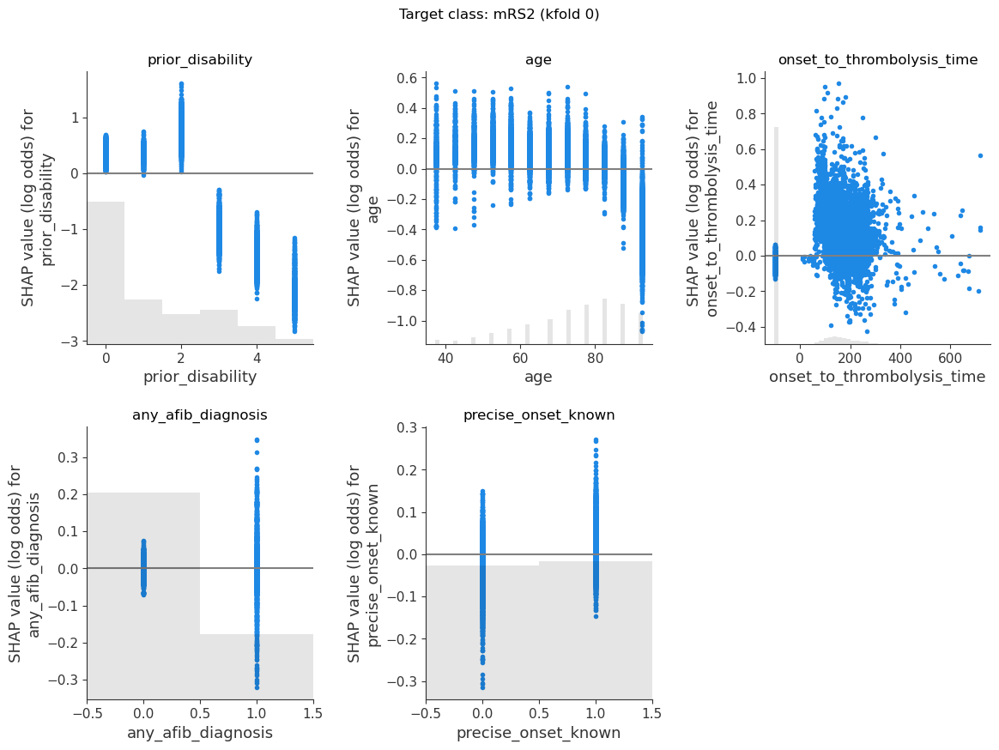

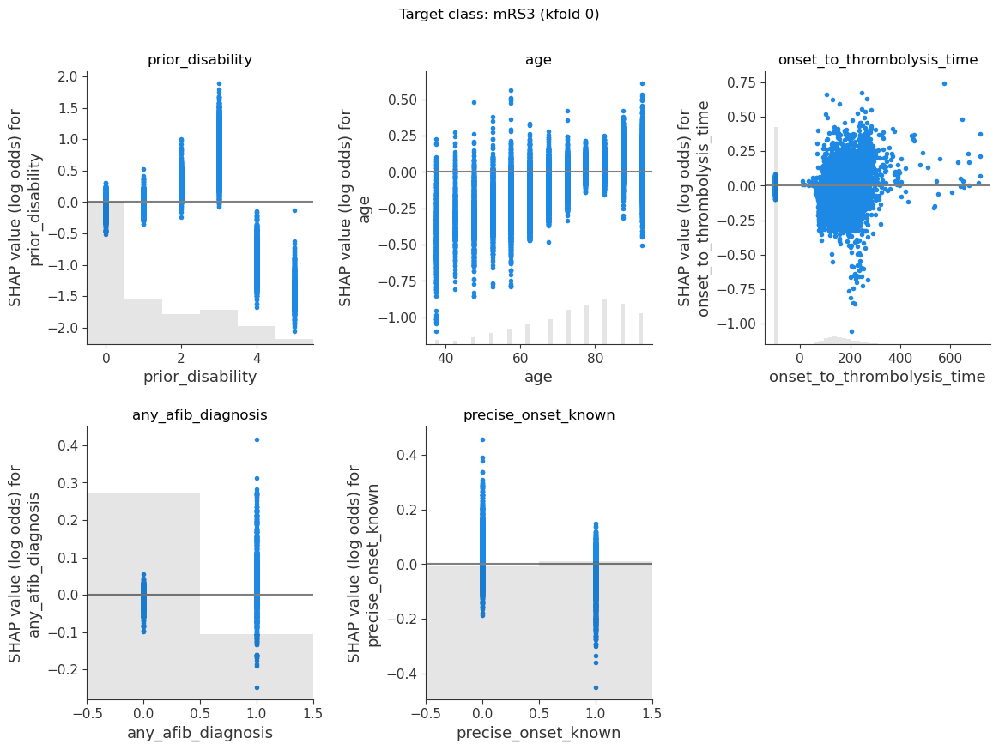

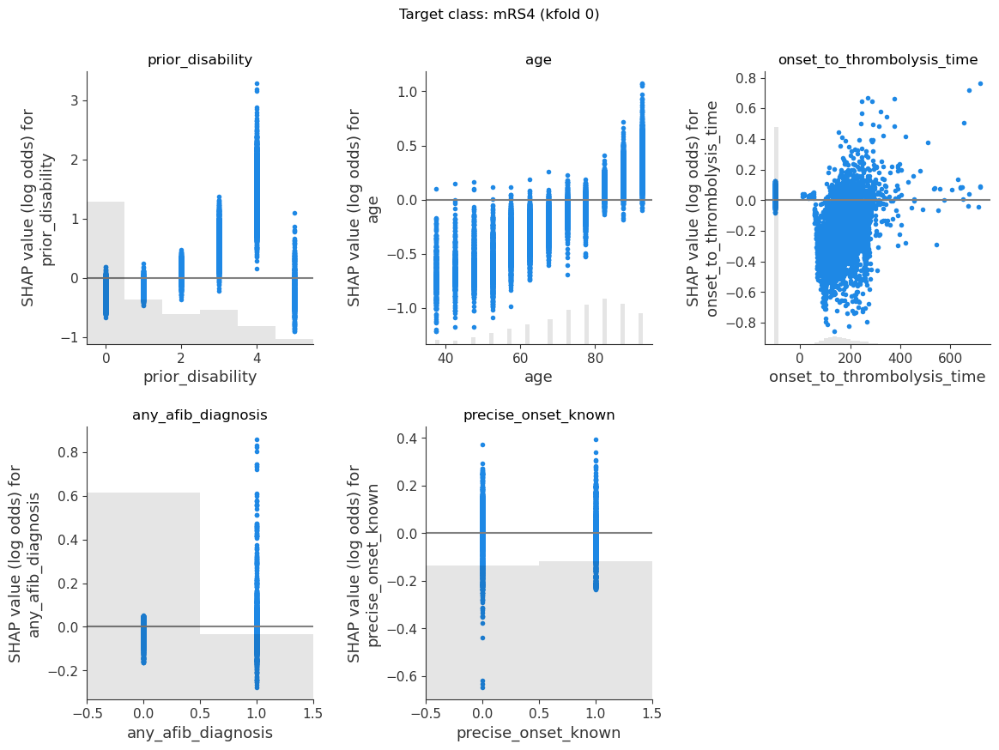

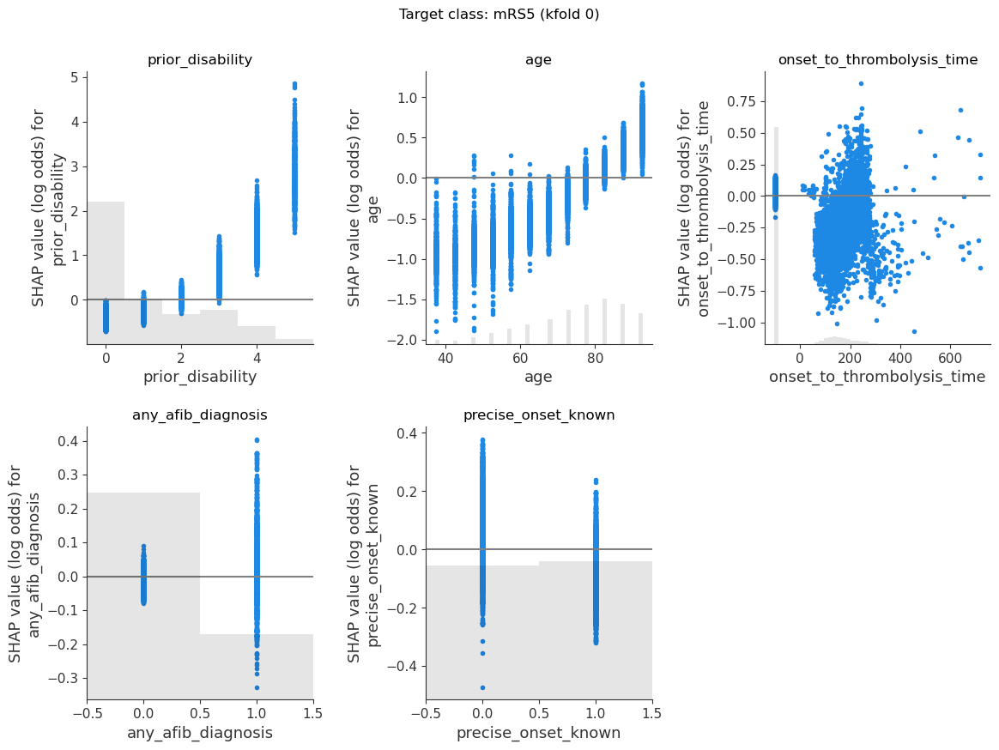

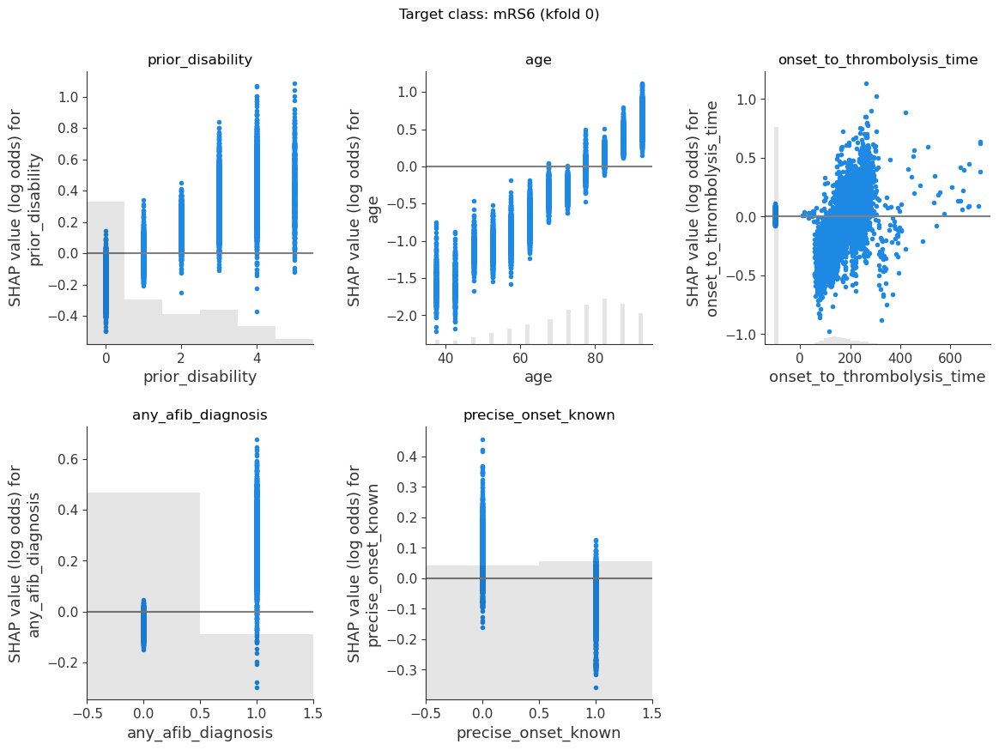

In [61]:
feat_to_show = ["prior_disability", "age", 
                "onset_to_thrombolysis_time", "any_afib_diagnosis", 
                "precise_onset_known"]

# Create a set of subplots per target class
for c in range(len(class_names)):

    fig = plt.figure(figsize=(12,9))
    fig.suptitle(f"Target class: mRS{c} (kfold {k})")

    for n, feat in enumerate(feat_to_show):    
        ax = fig.add_subplot(2,3,n+1)
        shap.plots.scatter(shap_values_extended[:, feat, c], x_jitter=0, 
                            ax=ax, show=False)
        
        # Add line at Shap = 0
        ax.plot([ax.get_xlim()[0], ax.get_xlim()[1]], [0,0], c='0.5')    
        
        ax.set_ylabel(f'SHAP value (log odds) for\n{feat}')
        ax.set_title(feat)
        
        # Censor arrival to scan to 1200 minutes
        if feat == 'Arrival-to-scan time':
            ax.set_xlim(0,1200)
    
    plt.tight_layout(pad=2)

    filename = os.path.join(paths.image_save_path, (paths.notebook + 
                            paths.model_text + 
                            f'_thrombolysis_shap_scatter_class{c}.jpg'))

    fig.savefig(filename, dpi=300, bbox_inches='tight', pad_inches=0.2)

    plt.show()

In [62]:
end_time = time.time()

print(f'Time taken: {end_time - start_time}')

Time taken: 641.6917634010315
